In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker

#plt.xkcd()

import pandas as pd
import time

idx = pd.IndexSlice
import datetime

,Fecha,Vacunas
0,2021-01-07,NaN
1,2021-01-08,0.000
2,2021-01-09,1.242
3,2021-01-10,0.000
4,2021-01-11,0.992
...,...,...
260,2021-09-24,3.252
261,2021-09-25,0.091
262,2021-09-26,0.000
263,2021-09-27,2.347


Fecha
2021-01-28    0.000
2021-01-29    0.000
2021-01-30    1.242
2021-01-31    0.000
2021-02-01    0.992
              ...  
2021-10-15    3.252
2021-10-16    0.091
2021-10-17    0.000
2021-10-18    2.347
2021-10-19    0.000
Name: Vacunas, Length: 265, dtype: float64

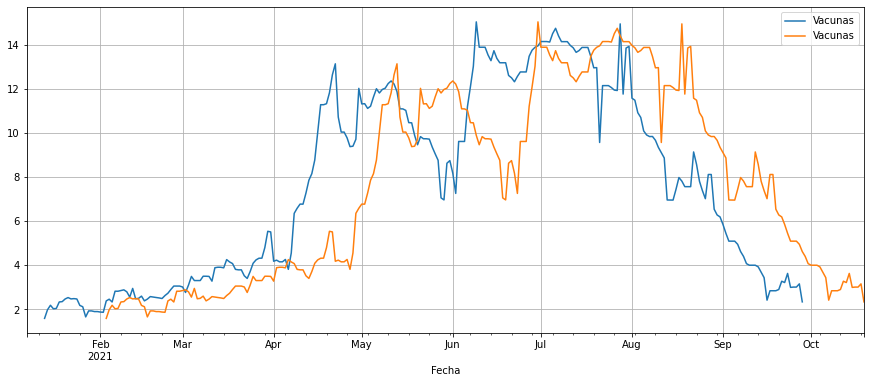

In [2]:
vacunas = pd.read_csv('Vacunas.csv',index_col='Fecha',parse_dates=True).diff()/1000.
vacunas.reset_index(inplace=True)
display(vacunas)
vacunasD = vacunas.copy()
vacunas.Fecha = vacunas.Fecha+ pd.Timedelta(21,unit='D')#21


vacunasD.set_index('Fecha',inplace=True)
vacunas.set_index('Fecha',inplace=True)
vacunasD.fillna(0,inplace=True)
vacunas.fillna(0,inplace=True)


fig, ax = plt.subplots(figsize=(15,6))
vacunasD.rolling(7,center=False).mean().plot(ax=ax)
vacunas.rolling(7,center=False).mean().plot(ax=ax)
plt.grid()
vacunas.Vacunas

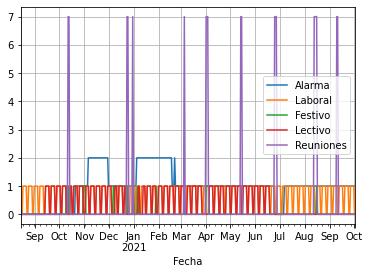

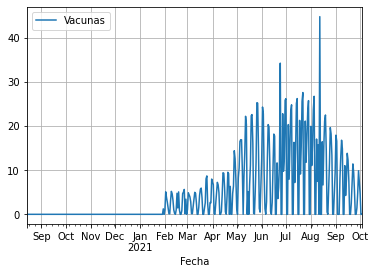

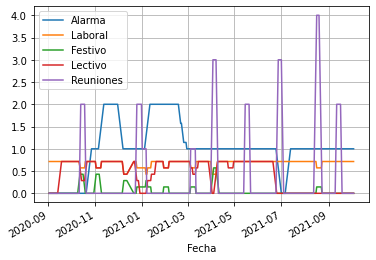

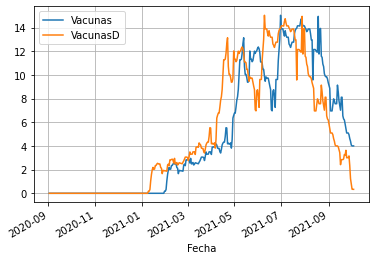

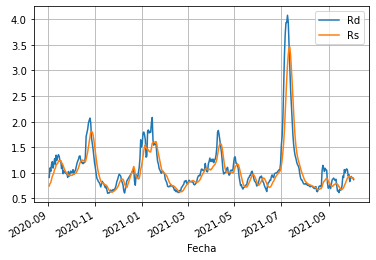

In [3]:
dateparse = lambda x: datetime.datetime.strptime(x, '%d/%m/%y')

edades = np.array([1319290,184542,123870,141711,200576,206170,176822,135180,150419])
puntos = pd.read_csv('Omega.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
puntos.sort_index(inplace=True)
puntos.columns
puntos['Asintomáticos (%)'] = puntos['Asintomáticos'].copy()
puntos['Asintomáticos'] = puntos['Asintomáticos (%)']*puntos['Casos']/100
puntos['Zaragoza (%)'] = puntos['Zaragoza']/puntos['Casos']*100
puntos['UCI/Camas (%)'] = puntos['UCI ocupadas']/puntos['Camas Ocup']*100
puntos['Camas/UCI'] = puntos['Camas Ocup']/puntos['UCI ocupadas']
puntos['Casos/Camas'] = puntos['Casos']/puntos['Camas Ocup']
puntos['Camas/Casos'] = puntos['Camas Ocup']/puntos['Casos']
puntos['Camas (%)'] = puntos['Camas Ocup']/(puntos['Camas libres'])*100.
puntos['UCI (%)'] = puntos['UCI ocupadas']/(puntos['UCI libres con resp'])*100.
puntos['Día'] = np.sin((puntos['Día de la semana']-.5)*2*np.pi /7)#.plot()
puntos['Rs'] = puntos.Casos.rolling(7,center=False).sum()/puntos.Casos.shift(7).rolling(7,center=False).sum()
puntos['Rd'] = puntos.Casos/puntos.Casos.shift(7)
puntos['Bias'] = 1
puntos['Festivo'] = 0
puntos['Lectivo'] = 1
puntos.loc['2021/6/21':,'Lectivo'] = 0

#goto
#puntos.loc['2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
#puntos.loc['2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']
puntos.loc['2020/10/10':'2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
puntos.loc['2020/10/31':'2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']

puntos.loc['2020/12/7':'2020/12/8',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2020/12/25',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2021/1/1',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/6',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/29',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/3/5',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/4/1':'2021/4/4',
           'Festivo'] = 1
puntos.loc['2021-04-23':'2021-04-24','Festivo'] = 0
puntos.loc['2021-08-16','Festivo'] = 1

puntos['Laboral'] = 1 - puntos.Festivo/1
puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0


#puntos.loc['2020/10/10':'2020/10/14','Laboral'] = 0
#puntos.loc['2020/10/31':'2020/11/2','Laboral'] = 0


puntos.loc['2020/10/10':'2020/10/14','Lectivo'] = 0
puntos.loc['2020/10/31':'2020/11/2','Lectivo'] = 0
puntos.loc[:'2020/9/13','Lectivo'] = 0
puntos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
puntos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
puntos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
puntos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
puntos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
puntos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0
puntos.loc['2021/1/29':'2021/1/30','Lectivo'] = 0
puntos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
puntos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
puntos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
puntos.loc['2021/6/21':,'Lectivo'] = 0

puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

puntos['NoLaboral'] = 1 - puntos.Laboral
puntos['NoLectivo'] = 1 - puntos.Lectivo

puntos['Reuniones'] = 0
puntos.loc['2020/10/12':'2020/10/13','Reuniones'] = 7
#puntos.loc['2020/10/12','Reuniones'] = 1
puntos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
#puntos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
puntos.loc['2020/12/31','Reuniones'] = 7
puntos.loc['2021/3/5','Reuniones'] = 7
puntos.loc['2021-04-01':'2021-04-03',
           'Reuniones'] = 7
puntos.loc['2021-05-14':'2021-05-15',
           'Reuniones'] = 7
puntos.loc['2021-06-25':'2021-06-27',
           'Reuniones'] = 7
#puntos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#puntos.loc['2021/7/9':'2021/7/11','Reuniones'] = 7
#puntos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#puntos.loc['2021/7/23':'2021/7/25','Reuniones'] = 7
#puntos.loc['2021/7/30':'2021/8/1','Reuniones'] = 7
#puntos.loc['2021/8/6':'2021/8/8','Reuniones'] = 7
puntos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
#puntos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7
#puntos.loc['2021/8/27':'2021/8/28','Reuniones'] = 7
#puntos.loc['2021/9/3':'2021/9/4','Reuniones'] = 7
puntos.loc['2021/9/10':'2021/9/11','Reuniones'] = 7
#puntos.loc['2021/9/17':'2021/9/18','Reuniones'] = 7

puntos.loc[:,'VacunasD'] = 0.
for i in puntos.index:
    if i in vacunasD.index:
        puntos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
puntos.loc[:,'Vacunas'] = 0.
for i in puntos.index:
    if i in vacunas.index:
        puntos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
puntos.loc[:,'Inoculados'] = (edades[0]-1000*puntos.Vacunas.cumsum()/2.45)*100./edades[0]# + puntos.Casos.cumsum()
puntos.loc[:,'Total Casos'] = (edades[0]-puntos.Casos.cumsum()-21313)*100./edades[0] # +21.313

puntos = pd.concat([puntos,(edades[1:]*.983-puntos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos '))/edades[1:]*100.],#/edades*100.],
         axis=1)
#puntos = pd.concat([puntos,puntos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')/edades[1:]*100.],#/edades*100.],
#         axis=1)

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas'
      ]].plot()

plt.grid()
plt.show()


semanal = puntos.rolling(7,center=False).mean().copy()
diario = puntos.copy()
puntos = puntos.rolling(7,center=False).mean().copy().dropna()

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas',
        'VacunasD',
      ]].plot()

plt.grid()
plt.show()


puntos[['Rd','Rs'
      ]].plot()

plt.grid()
plt.show()
#puntos['Día'] = diario['Día']
#puntos['Alarma'] = diario.Alarma
#puntos['Festivo'] = diario['Festivo']
#puntos['Laboral'] = diario['Laboral']
#puntos['Reuniones'] = diario['Reuniones']
#puntos['Bias'] = diario['Bias']

In [4]:
diario.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-29,3,100,2578,1831.0,3.88,71.00,76,22,5,10,...,40.735594,87.751745,88.946032,81.244216,86.145686,89.069085,88.610423,89.211199,91.177645,88.942140
2021-09-30,4,101,2263,1687.0,4.46,56.56,87,21,5,11,...,40.513272,87.744090,88.934652,81.240179,86.137924,89.055125,88.602178,89.206675,91.174686,88.938151
2021-10-01,5,60,1296,1757.0,4.63,25.20,48,9,4,10,...,40.368111,87.739542,88.929775,81.236950,86.130867,89.048644,88.600238,89.203281,91.170247,88.932832
2021-10-02,6,47,626,919.0,7.51,20.21,40,13,5,4,...,40.368111,87.735979,88.922731,81.232914,86.128044,89.045154,88.597812,89.201585,91.166548,88.929508
2021-10-03,7,22,975,679.0,2.26,20.02,15,3,0,4,...,40.368111,87.734312,88.921105,81.232914,86.125222,89.042661,88.596357,89.200454,91.165809,88.926849


In [5]:
nuevos = pd.read_csv('Omega_new.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
nuevos.sort_index(inplace=True)
nuevos.columns
#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
nuevos['Asintomáticos (%)'] = nuevos['Asintomáticos'].copy()
nuevos['Asintomáticos'] = nuevos['Asintomáticos (%)']*nuevos['Casos']/100
nuevos['Zaragoza (%)'] = nuevos['Zaragoza']/nuevos['Casos']*100
nuevos['UCI/Camas (%)'] = nuevos['UCI ocupadas']/nuevos['Camas Ocup']*100
nuevos['Camas/UCI'] = nuevos['Camas Ocup']/nuevos['UCI ocupadas']
nuevos['Casos/Camas'] = nuevos['Casos']/nuevos['Camas Ocup']
nuevos['Camas/Casos'] = nuevos['Camas Ocup']/nuevos['Casos']
nuevos['Camas (%)'] = nuevos['Camas Ocup']/(nuevos['Camas libres'])*100.
nuevos['UCI (%)'] = nuevos['UCI ocupadas']/(nuevos['UCI libres con resp'])*100.
nuevos['Día'] = np.sin((nuevos['Día de la semana']-.5)*2*np.pi /7)#.plot()
nuevos['Bias'] = 1
nuevos['Rs'] = nuevos.Casos.rolling(7,center=False).sum()/nuevos.Casos.shift(7).rolling(7,center=False).sum()
nuevos['Rd'] = nuevos.Casos/nuevos.Casos.shift(7)
nuevos['Festivo'] = 0
nuevos['Lectivo'] = 1

#nuevos.loc['2021/6/21':,'Lectivo'] = 0

#nuevos.loc['2020/12/7':'2020/12/8',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2020/12/25',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2021/1/1',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/1/6',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/3/5',
#           'Festivo'] = 1
#nuevos.loc['2021/4/1':'2021/4/4',
#           'Festivo'] = 1
#nuevos.loc['2021-04-23','Festivo'] = 0
#nuevos.loc['2021-08-16','Festivo'] = 1
nuevos['Laboral'] = 1# - nuevos.Festivo/1
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0

#nuevos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
#nuevos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
#nuevos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0

#nuevos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
#nuevos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
#nuevos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

#nuevos.loc[:'2020/9/13','Lectivo'] = 0

nuevos['NoLaboral'] = 1 - nuevos.Laboral
nuevos['NoLectivo'] = 1 - nuevos.Lectivo



nuevos['Reuniones'] = 0 
#nuevos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
##nuevos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
#nuevos.loc['2020/12/31','Reuniones'] = 7
##nuevos.loc['2020/12/24','Reuniones'] = 1
##nuevos.loc['2020/12/25','Reuniones'] = 1
##nuevos.loc['2020/12/31','Reuniones'] = 1
#nuevos.loc['2021/4/1':'2021/4/3','Reuniones'] = 7
#nuevos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#nuevos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#nuevos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
## esperemos que rterminen no fiestas por un tiempo 
#nuevos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7



nuevos.loc[:,'VacunasD'] = np.nan
for i in nuevos.index:
    if i in vacunasD.index:
        nuevos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
nuevos.loc[:,'Vacunas'] = np.nan
for i in nuevos.index:
    if i in vacunas.index:
        nuevos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
nuevos.loc[:,'Inoculados'] = diario.Inoculados.iat[-1] - 1000.*nuevos.Vacunas.cumsum()/2.45*100/edades[0]
nuevos.loc[:,'Total Casos'] = diario['Total Casos'].iat[-1]-nuevos.Casos.cumsum()*100./edades[0]

nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]-nuevos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'
                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
         axis=1)
#nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]+nuevos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más'
#                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
#         axis=1)


nuevos.tail(10).T


Fecha,2021-10-04,2021-10-05,2021-10-06,2021-10-07,2021-10-08
Día de la semana,1.000000,2.000000,3.000000,4.000000e+00,5.000000
Casos,67.000000,81.000000,62.000000,NaN,NaN
test coresp,2402.000000,2462.000000,2343.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,0.000000,0.000000,0.000000,NaN,NaN
Tasa de positividad (%),2.790000,3.290000,2.650000,NaN,NaN
Asintomáticos,46.900000,46.170000,39.060000,NaN,NaN
Zaragoza,45.000000,58.000000,40.000000,NaN,NaN
1 a 14 años,7.000000,16.000000,11.000000,NaN,NaN
15 a 24 años,6.000000,4.000000,6.000000,NaN,NaN
25 a 34 años,4.000000,4.000000,8.000000,NaN,NaN


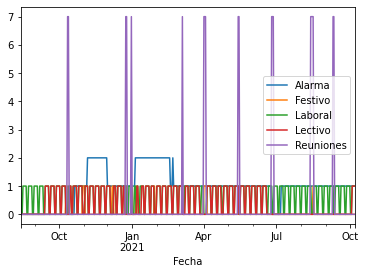

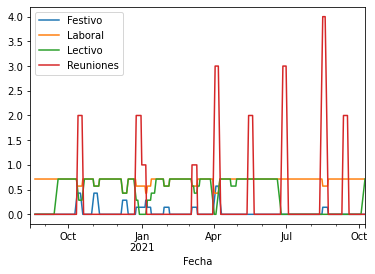

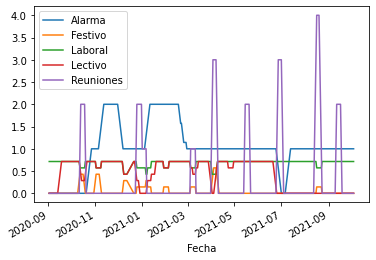

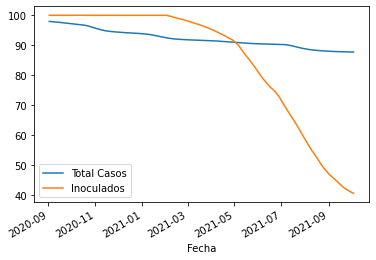

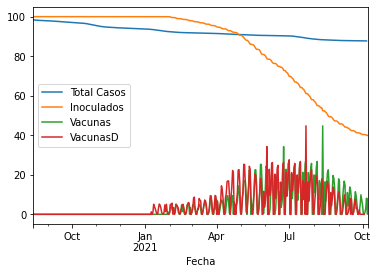

In [6]:
total = pd.concat([diario,nuevos])
total[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
total[[
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].rolling(7,center=False).mean().plot()
plt.show()
puntos[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
puntos[['Total Casos',
       'Inoculados',
      ]].plot()
plt.show()
total[['Total Casos',
       'Inoculados',
       'Vacunas',
       'VacunasD',
      ]].plot()
plt.show()

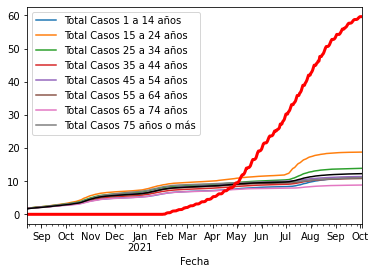

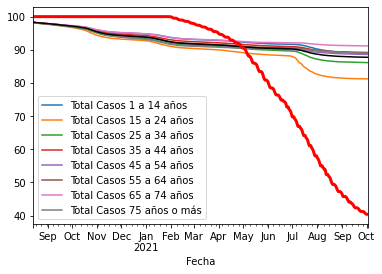

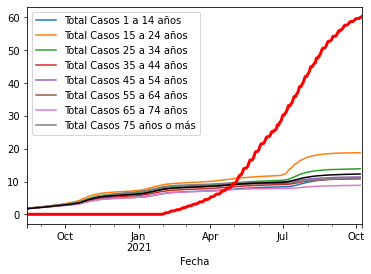

,Total Casos,Inoculados
Fecha,,
2020-08-14,98.337212,100.000000
2020-08-15,98.300677,100.000000
2020-08-16,98.271116,100.000000
2020-08-17,98.241099,100.000000
2020-08-18,98.205702,100.000000
...,...,...
2021-10-04,87.729233,40.339462
2021-10-05,87.723093,40.243740
2021-10-06,87.718394,39.990790


,Total Casos,Inoculados
Fecha,,
2021-10-04,87.729233,40.339462
2021-10-05,87.723093,40.243740
2021-10-06,87.718394,39.990790
2021-10-07,NaN,39.989645
2021-10-08,NaN,39.752133


In [7]:
(100.-diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100.-diario['Total Casos']).plot(color='k')
(100.-diario['Inoculados']).plot(color='r',lw=3)
plt.show()
(diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(diario['Total Casos']).plot(color='k')
(diario['Inoculados']).plot(color='r',lw=3)
plt.show()

(100-total[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100-total['Total Casos']).plot(color='k')
(100-total['Inoculados']).plot(color='r',lw=3)
plt.show()
display(total[['Total Casos','Inoculados']])
display(nuevos[['Total Casos','Inoculados']])

In [8]:

total = pd.concat([diario,nuevos])
nuevos['Rs'] = (total.Casos.rolling(7,center=False).sum()/total.Casos.shift(7).rolling(7,center=False).sum()).loc[nuevos.index]
nuevos['Rd'] = (total.Casos/total.Casos.shift(7)).loc[nuevos.index]

nuevos


,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-10-04,1,67.0,2402.0,0.0,2.79,46.90,45.0,7.0,6.0,4.0,...,40.339462,87.729233,88.917312,81.228070,86.122399,89.038673,88.591507,89.195929,91.157671,88.918206
2021-10-05,2,81.0,2462.0,0.0,3.29,46.17,58.0,16.0,4.0,4.0,...,40.243740,87.723093,88.908642,81.224841,86.119576,89.029698,88.587627,89.189143,91.150274,88.912223
2021-10-06,3,62.0,2343.0,0.0,2.65,39.06,40.0,11.0,6.0,8.0,...,39.990790,87.718394,88.902681,81.219997,86.113931,89.024713,88.584716,89.185184,91.145835,88.908899
2021-10-07,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39.989645,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-08,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39.752133,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
display(total.columns)
edades = [1319290,184542,123870,141711,200576,206170,176822,135180,150419]
pd.concat([total,total[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')],#/edades*100.],
         axis=1)

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 65 a 74 años,Total Casos 75 años o más,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,5,624.0,4177.0,3481.0,14.94,318.24,541.0,96.0,78.0,85.0,...,98.264492,98.264765,96.0,78.0,85.0,84.0,85.0,87.0,48.0,53.0
2020-08-15,6,482.0,3243.0,1907.0,14.86,216.90,428.0,67.0,51.0,64.0,...,98.240080,98.227536,163.0,129.0,149.0,167.0,152.0,144.0,81.0,109.0
2020-08-16,7,390.0,3158.0,1168.0,12.35,230.10,338.0,53.0,54.0,38.0,...,98.209750,98.208256,216.0,183.0,187.0,237.0,203.0,196.0,122.0,138.0
2020-08-17,1,396.0,3408.0,3189.0,11.62,233.64,307.0,51.0,41.0,40.0,...,98.182379,98.177010,267.0,224.0,227.0,299.0,264.0,250.0,159.0,185.0
2020-08-18,2,467.0,4029.0,3580.0,11.59,270.86,394.0,49.0,50.0,72.0,...,98.153529,98.150418,316.0,274.0,299.0,371.0,340.0,315.0,198.0,225.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-04,1,67.0,2402.0,0.0,2.79,46.90,45.0,7.0,6.0,4.0,...,91.157671,88.918206,17315.0,21147.0,17257.0,18576.0,20016.0,16098.0,9655.0,14112.0
2021-10-05,2,81.0,2462.0,0.0,3.29,46.17,58.0,16.0,4.0,4.0,...,91.150274,88.912223,17331.0,21151.0,17261.0,18594.0,20024.0,16110.0,9665.0,14121.0
2021-10-06,3,62.0,2343.0,0.0,2.65,39.06,40.0,11.0,6.0,8.0,...,91.145835,88.908899,17342.0,21157.0,17269.0,18604.0,20030.0,16117.0,9671.0,14126.0


In [10]:
variables = [
    'Casos', 
    'test coresp', 'Tasa de positividad (%)',
    #'Nº de pacientes a los que se ha realizado pruebas',
    'Asintomáticos', 'Asintomáticos (%)',
    'Zaragoza','Zaragoza (%)',
    '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 
    'Camas Ocup', 'Camas libres', 'Camas (%)',
    'UCI ocupadas', 'UCI libres con resp','UCI (%)',
    'Rs',
    'Rd',
    #'UCI/Camas (%)',
    #'Camas/UCI',
    #'Casos/Camas',
    #'Camas/Casos',
    #'Alarma',
    #'Día', 
    #'Bias',
    'Inoculados',
    'Total Casos',
    'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'
]
entradas = ['Alarma','Laboral','Lectivo','Reuniones','Festivo','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias',
            'Vacunas',#'VacunasD'
            #'Inoculados'
           ]



In [11]:
def find_weekend_indices(datetime_array):
    indices=[]
    for i in range(len(datetime_array)):
        #if datetime_array[i].day_name() in ['Saturday', 'Sunday']:
        if datetime_array[i].weekday()+1 in [6,7]:
            indices.append(i)
    return indices

weekend_indices = find_weekend_indices(puntos.index)

def highlight_datetimes(index, ax,items=True):
    indices = find_weekend_indices(index)
    i = 0
    while i < len(indices):
        ax.axvspan(index[indices[i]], index[indices[i] + 1], facecolor='gray', edgecolor='none', alpha=.05)
        i += 1
    if items:
        ax.axvline(x=datetime.datetime(2020, 3, 8),ls='--',linewidth=4, color='purple',alpha=.4,label='Manifestación y Vox')
        ax.axvline(x=datetime.datetime(2020, 3, 9),linewidth=4, color='green',alpha=.4,label='PV y MD Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 12),linewidth=4, color='yellow',alpha=.4,label='AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 15),linewidth=4, color='r',alpha=.4,label='Estado de alarma')
        ax.axvline(x=datetime.datetime(2020, 3, 28),linewidth=4, color='brown',alpha=.4,label='Servicios no esenciales')
        ax.axvline(x=datetime.datetime(2020, 4, 26),ls='--',linewidth=4, color='orange',alpha=.4,label='Niños a la calle')
        ax.axvline(x=datetime.datetime(2020, 5, 4),ls='--',linewidth=4, color='lightblue',alpha=.4,label='Fase 0')
        ax.axvline(x=datetime.datetime(2020, 5, 11),ls='--',linewidth=4, color='blue',alpha=.4,label='Fase 1')
        ax.axvline(x=datetime.datetime(2020, 5, 25),ls='--',linewidth=4, color='darkblue',alpha=.4,label='Fase 2')
        ax.axvline(x=datetime.datetime(2020, 6, 8),ls='--',linewidth=4, color='lightgreen',alpha=.4,label='Fase 3')
        ax.axvline(x=datetime.datetime(2020, 6, 21),ls='--',linewidth=4, color='black',alpha=.4,label='Nueva Normalidad')
        ax.axvline(x=datetime.datetime(2020, 9, 14),linewidth=4, color='yellow',alpha=.4,label='Apertura AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 10, 25),linewidth=4, color='darkred',alpha=.4,label='Nivel III')
        ax.axvline(x=datetime.datetime(2020, 11, 8),linewidth=4, color='brown',alpha=.4,label='nivel III Agravado')



In [12]:
repartoDiaSemana = diario[['Día de la semana']].join(diario[variables].divide(
                                                                    diario[variables].rolling(7,center=True).mean())
                                                    ).dropna().groupby(['Día de la semana']).mean()

#diario['Camas Ocup'] = diario['Camas Ocup'].diff()
#diario['UCI ocupadas'] = diario['UCI ocupadas'].diff()
#semanal['Camas Ocup'] = semanal['Camas Ocup'].diff()
#semanal['UCI ocupadas'] = semanal['UCI ocupadas'].diff()
repartoDiaSemana.loc[:,'Total Casos'] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()
repartoDiaSemana.loc[:,'Inoculados'] = 1
repartoDiaSemana.loc[:,['Rs','Rd']] = 1
#repartoDiaSemana.loc[:,['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()


display(repartoDiaSemana)
repartoDiaSemana.mean()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Día de la semana,,,,,,,,,,,,,,,,,,,,,
1,0.848716,0.932916,0.917881,0.827721,0.966010,0.773461,0.915625,0.729243,0.790559,0.839920,...,1,1,1.000107,1.000195,1.000116,1.000091,1.000087,1.000082,1.000050,1.000059
2,1.200466,1.212988,0.986530,1.169523,0.972894,1.206512,1.001397,1.261670,1.181506,1.206807,...,1,1,1.000058,1.000122,1.000059,1.000039,1.000043,1.000033,1.000032,1.000039
3,1.188356,1.217269,0.978520,1.180763,0.994014,1.210585,1.019853,1.207694,1.238157,1.181347,...,1,1,1.000007,1.000012,1.000003,0.999990,0.999994,0.999989,1.000007,1.000019
4,1.208475,1.130652,1.072361,1.229553,1.019677,1.219022,1.014331,1.218939,1.255253,1.214323,...,1,1,0.999955,0.999898,0.999940,0.999957,0.999952,0.999958,0.999972,0.999965
5,1.133176,1.119561,1.021228,1.082503,0.955305,1.138541,1.012895,1.171232,1.169484,1.167096,...,1,1,0.999903,0.999798,0.999883,0.999915,0.999914,0.999925,0.999944,0.999937
6,0.847707,0.818851,1.045363,0.932599,1.093876,0.890706,1.050058,0.924610,0.819739,0.834578,...,1,1,0.999923,0.999871,0.999927,0.999953,0.999948,0.999957,0.999961,0.999952
7,0.551225,0.564358,0.964055,0.555252,0.997811,0.543178,0.987768,0.471659,0.511105,0.529577,...,1,1,1.000041,1.000085,1.000060,1.000049,1.000053,1.000047,1.000026,1.000020


Casos                        0.996875
test coresp                  0.999514
Tasa de positividad (%)      0.997991
Asintomáticos                0.996845
Asintomáticos (%)            0.999941
Zaragoza                     0.997429
Zaragoza (%)                 1.000276
1 a 14 años                  0.997864
15 a 24 años                 0.995115
25 a 34 años                 0.996235
35 a 44 años                 0.996260
45 a 54 años                 0.998907
55 a 64 años                 0.994469
65 a 74 años                 0.997268
75 años o más                0.990574
Camas Ocup                   0.997976
Camas libres                 0.999932
Camas (%)                    0.997105
UCI ocupadas                 0.999068
UCI libres con resp          0.999469
UCI (%)                      0.998275
Rs                           1.000000
Rd                           1.000000
Inoculados                   1.000000
Total Casos                  1.000000
Total Casos 1 a 14 años      0.999999
Total Casos 

In [13]:
diario.Casos.shift(0).rolling(7,center=False).sum()/diario.Casos.shift(7).rolling(7,center=False).sum()

Fecha
2020-08-14         NaN
2020-08-15         NaN
2020-08-16         NaN
2020-08-17         NaN
2020-08-18         NaN
                ...   
2021-09-29    0.893581
2021-09-30    0.915683
2021-10-01    0.883959
2021-10-02    0.889081
2021-10-03    0.871252
Name: Casos, Length: 416, dtype: float64

In [14]:
nuevos.Casos/nuevos.Casos.shift(1)

Fecha
2021-10-04         NaN
2021-10-05    1.208955
2021-10-06    0.765432
2021-10-07         NaN
2021-10-08         NaN
Name: Casos, dtype: float64

In [15]:

#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
#puntos['Camas Ocup'] = puntos['Camas Ocup'].diff()
#puntos['UCI ocupadas'] = puntos['UCI ocupadas'].diff()
total = pd.concat([diario,nuevos])
#puntos = total.rolling(7,center=False).mean().copy().dropna()
diario[variables].divide(semanal[variables]).head(10)#.columns

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-20,0.815867,0.921760,0.890012,0.869139,1.054545,0.768627,0.949875,0.789216,0.821229,0.978313,...,1.0,0.999097,0.999189,0.998890,0.998782,0.999159,0.999125,0.999140,0.999293,0.999205
2020-08-21,0.702324,0.856468,0.822585,0.810898,1.140351,0.682390,0.977908,0.813031,0.656958,0.823529,...,1.0,0.999185,0.999241,0.999015,0.998849,0.999302,0.999257,0.999243,0.999359,0.999193
2020-08-22,1.267818,1.317408,0.963189,1.342138,1.057554,1.304977,1.033834,1.180233,1.302839,0.921569,...,1.0,0.999105,0.999192,0.998901,0.998877,0.999235,0.999189,0.999158,0.999273,0.999093


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,272.000000,2633.857143,10.348571,159.558571,58.571429,204.000000,74.923581,29.571429,29.142857,33.428571,...,100.000000,97.920635,97.891498,97.727626,97.735773,97.873870,97.875039,97.836661,97.917019,97.847645
2020-09-04,260.142857,2490.428571,10.432857,154.922857,59.714286,192.714286,74.085108,27.857143,29.000000,31.714286,...,100.000000,97.900916,97.876403,97.704214,97.713394,97.858201,97.856191,97.815574,97.900850,97.824566
2020-09-05,281.000000,2562.000000,10.852857,173.357143,60.571429,216.000000,76.118888,30.714286,32.285714,34.000000,...,100.000000,97.879617,97.859760,97.678150,97.689401,97.841535,97.835473,97.794407,97.883518,97.798259
2020-09-06,287.428571,2528.428571,11.450000,169.327143,57.285714,224.000000,77.348069,31.571429,32.142857,33.857143,...,100.000000,97.857830,97.842652,97.652201,97.665509,97.824156,97.813785,97.771543,97.866927,97.771761
2020-09-07,279.142857,2458.285714,11.434286,162.124286,56.142857,215.428571,76.327781,30.000000,30.142857,32.000000,...,100.000000,97.836672,97.826395,97.627867,97.642928,97.807561,97.792652,97.749406,97.851497,97.743554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-29,75.571429,2169.714286,3.532857,44.864286,58.142857,54.714286,73.001595,15.000000,5.000000,8.571429,...,41.152286,87.769590,88.971423,81.256095,86.164235,89.087247,88.627053,89.223156,91.192228,88.964078
2021-09-30,77.571429,2167.428571,3.624286,45.238571,57.285714,58.428571,75.290690,15.285714,4.571429,9.285714,...,41.026284,87.763711,88.963140,81.252404,86.157682,89.080979,88.621371,89.219924,91.187790,88.956481
2021-10-01,74.000000,1983.857143,3.815714,42.888571,56.285714,56.857143,76.803295,14.714286,4.571429,8.285714,...,40.902469,87.758101,88.955166,81.248714,86.151835,89.074427,88.616313,89.216208,91.183880,88.949737


<AxesSubplot:xlabel='Fecha'>

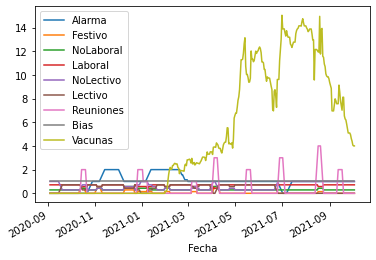

In [16]:


#entradas = ['Alarma','Festivo','Laboral','Lectivo','Reuniones','Bias']
X_prima = puntos[variables].iloc[1:].T
Omega       = puntos[variables+entradas].shift(1).iloc[1:].T
display(X_prima.T)
display(Omega.T[entradas].plot())


In [17]:
%%time 
Omega_pinv = pd.DataFrame(np.linalg.pinv(Omega),index=Omega.columns,columns=Omega.index)#.shape
Omega_pinv

CPU times: user 27.9 ms, sys: 10.7 ms, total: 38.6 ms
Wall time: 6.41 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,0.000348,-0.000022,-0.008697,-0.000430,0.003254,-0.000313,-0.001304,-0.001259,0.000755,0.000990,...,0.968409,0.018967,0.050883,-2.401081,-2.202992,-2.281263,-2.322811,0.000491,-4.604073,0.002594
2020-09-04,0.000399,0.000026,-0.003354,-0.000444,0.002006,-0.000161,-0.000750,-0.001938,0.000010,0.000695,...,0.851679,0.012721,0.011011,-3.985098,-3.915951,-3.931715,-3.969335,0.002777,-7.901050,0.000378
2020-09-05,0.001087,-0.000015,-0.007107,-0.000614,0.003732,-0.000533,-0.000272,-0.001007,0.000229,-0.000173,...,0.600124,0.023712,0.040369,-1.191912,-1.057534,-1.104546,-1.144900,-0.000646,-2.249446,0.002209
2020-09-06,0.000042,-0.000034,-0.008584,-0.000297,0.002686,0.000410,-0.000290,-0.000573,0.000541,0.001028,...,0.524539,0.011244,0.055799,-1.230057,-1.119230,-1.158151,-1.191136,-0.001782,-2.349286,0.000555
2020-09-07,0.000244,-0.000008,-0.001648,-0.000044,0.000174,0.000420,0.001402,-0.000956,-0.000313,0.000090,...,0.256723,0.006652,0.040969,-1.463028,-1.392775,-1.411566,-1.444237,-0.001151,-2.855803,-0.002555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-29,0.000716,0.000118,0.016487,0.000015,0.000564,-0.001142,0.004275,-0.001330,-0.000723,-0.000773,...,-0.323859,-0.008443,-0.014578,-0.149569,-0.209637,-0.170387,-0.188819,-0.001529,-0.359206,-0.003929
2021-09-30,0.000740,0.000102,0.012399,-0.000198,0.002123,-0.000900,0.003271,-0.001759,-0.000974,-0.000427,...,-0.308134,0.006461,-0.022640,0.489664,0.423037,0.470882,0.441819,-0.000907,0.912701,-0.003422
2021-10-01,0.000662,0.000102,0.013520,0.000078,0.001081,-0.000881,0.004479,-0.002536,-0.001230,-0.000092,...,-0.212434,0.006004,-0.015375,0.257187,0.206716,0.248014,0.215889,-0.000298,0.463903,-0.006028



$$ X' = G_{nx(n+q)} \Omega \Leftrightarrow G_{nx(n+q)} = X'\Omega^\dagger $$

In [18]:
celdas = X_prima.index


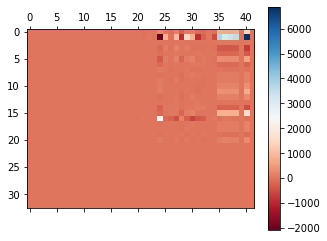

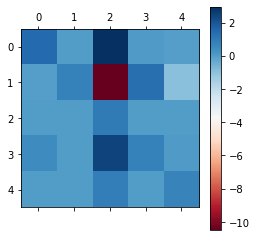

In [19]:
G = X_prima.dot( Omega_pinv)
plt.matshow(G, cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()
plt.matshow(G.iloc[:5,:5], cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()

Step 1
------

$$\Omega = \tilde U \tilde \Sigma \tilde V^* $$

In [20]:
%%time
U_tilde,kS_tilde,V_tilde_star = np.linalg.svd(Omega,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_tilde = pd.DataFrame(np.diag(kS_tilde),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

V_tilde_star = pd.DataFrame(V_tilde_star,
                            columns=Omega.columns,
                            index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                           )

U_tilde = pd.DataFrame(U_tilde,index=Omega.index,
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],)



print("{} = {}·{}·{}".format(Omega.shape,U_tilde.shape,Sigma_tilde.shape,V_tilde_star.shape))

(42, 388) = (42, 42)·(42, 42)·(42, 388)
CPU times: user 27.6 ms, sys: 9.91 ms, total: 37.6 ms
Wall time: 5.73 ms


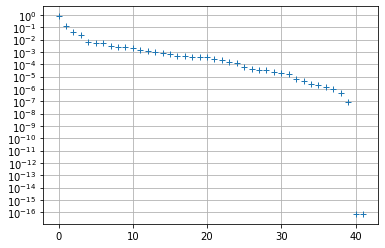

In [21]:
plt.plot(kS_tilde/kS_tilde.sum(),'+')

plt.yscale('symlog', linthresh=1.e-29)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,210)
plt.grid()

In [22]:
r_tilde=np.min([len(X_prima.columns),len(X_prima.index)])#205#33#25#41#65#11#43#33
corRed_tilde = ['$P_{{{}}}$'.format(i) for i in range(r_tilde)]

Step 2
-------
$$ G_{nx(n+q)} = X'\Omega^\dagger = X' \tilde V \tilde \Sigma^{-1}\tilde U^*$$

$$ [{A}_{nxn},B_{nxq}] = [ X' \tilde V \tilde \Sigma^{-1}\tilde U^*_1, X' \tilde V \tilde \Sigma^{-1}\tilde U^*_2]$$

In [23]:
U_tilde

,$P_{0}$,$P_{1}$,$P_{2}$,$P_{3}$,$P_{4}$,$P_{5}$,$P_{6}$,$P_{7}$,$P_{8}$,$P_{9}$,...,$P_{32}$,$P_{33}$,$P_{34}$,$P_{35}$,$P_{36}$,$P_{37}$,$P_{38}$,$P_{39}$,$P_{40}$,$P_{41}$
Casos,-0.118749,0.244534,-0.178981,-0.671437,0.068762,0.040129,0.042423,0.410684,0.062980,-0.107757,...,0.001203,0.001810,0.001516,1.147063e-04,0.000160,5.246290e-05,0.000075,0.000023,6.286825e-19,-3.592124e-18
test coresp,-0.888950,0.332041,-0.074891,0.303365,0.009242,-0.019211,0.002877,0.008754,0.004844,0.030345,...,-0.000023,-0.000096,0.000003,4.165780e-07,-0.000003,-2.643427e-05,0.000008,-0.000004,-6.404522e-19,3.175795e-19
Tasa de positividad (%),-0.003496,0.000408,-0.002246,-0.023765,-0.010903,0.002572,-0.015575,0.024983,-0.033882,-0.003305,...,-0.005848,-0.003260,0.001435,-6.263164e-03,-0.002324,-7.869294e-03,0.000578,-0.000517,2.795948e-17,1.127775e-16
Asintomáticos,-0.059973,0.132535,-0.110353,-0.339084,0.039350,-0.159615,0.380372,-0.737964,0.218992,-0.118246,...,-0.000800,-0.000024,-0.000595,-1.809501e-04,-0.000295,-8.164892e-05,-0.000060,-0.000005,8.007620e-19,9.043801e-18
Asintomáticos (%),-0.014324,-0.023044,0.002167,0.004071,0.021241,-0.036905,0.071941,-0.123366,0.163176,-0.089480,...,-0.000982,0.000559,0.000580,1.038404e-04,0.001332,-3.758460e-04,0.000119,0.000073,1.372288e-17,-2.546321e-17
Zaragoza,-0.083131,0.154878,-0.122458,-0.409236,0.022537,0.172584,-0.319217,-0.139615,-0.348806,0.141306,...,0.000585,0.000273,-0.000634,8.770656e-05,0.000338,5.968904e-07,0.000060,0.000016,3.842895e-19,-2.625378e-18
Zaragoza (%),-0.020782,-0.041618,0.005291,0.033189,0.047723,0.164791,-0.170886,-0.136713,-0.024816,-0.245466,...,0.001524,0.001795,-0.000557,-9.535361e-04,0.000051,1.699597e-04,0.000406,-0.000041,-5.955407e-18,1.431481e-18
1 a 14 años,-0.014348,0.022857,-0.029430,-0.037443,0.074487,-0.319687,0.110663,0.050771,-0.474696,-0.396765,...,-0.001392,0.002158,-0.000476,-7.663491e-04,-0.000697,3.175876e-04,-0.000437,0.000028,3.448756e-18,-2.320233e-18
15 a 24 años,-0.018246,0.035691,-0.195599,-0.116621,-0.827222,0.061731,-0.141435,0.076789,0.202541,0.032563,...,-0.001445,-0.001581,-0.001333,-2.658383e-04,-0.000009,6.529305e-05,-0.000320,-0.000004,7.109680e-18,-7.359219e-18
25 a 34 años,-0.014664,0.031203,-0.068451,-0.084854,-0.134099,-0.036311,0.016839,-0.095549,-0.102846,-0.090400,...,0.001682,-0.000272,-0.001544,-1.143850e-03,0.000127,4.372117e-04,-0.000172,-0.000049,4.323811e-20,3.739540e-18


In [24]:
%%time
U_tilde_r = U_tilde.loc[:,corRed_tilde]
Sigma_tilde_r = Sigma_tilde.loc[corRed_tilde,corRed_tilde]

Sigma_tilde_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_tilde)),
                              1./kS_tilde
                             ),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

Sigma_tilde_inv_r = Sigma_tilde_inv.loc[corRed_tilde,corRed_tilde]
V_tilde = V_tilde_star.T
V_tilde_r = V_tilde.loc[:,corRed_tilde]

U_tilde_1 = U_tilde.loc[X_prima.index]
U_tilde_2 = U_tilde.loc[['Alarma']]
U_tilde_1_r = U_tilde_1.loc[:,corRed_tilde]
U_tilde_2_r = U_tilde_2.loc[:,corRed_tilde]

CPU times: user 2.23 ms, sys: 255 µs, total: 2.49 ms
Wall time: 2.31 ms


In [25]:
%%time
G = X_prima.dot(V_tilde_r).dot(Sigma_tilde_inv_r).dot(U_tilde_r.T)
G

CPU times: user 72.3 ms, sys: 2.16 ms, total: 74.4 ms
Wall time: 11.2 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Casos,1.243871,0.002744,2.483460,0.110556,-0.184476,-0.383541,0.379105,-1.199546,0.269920,-0.099472,...,-1.994225,-3.829740,-62.328364,24.723307,-25.240792,0.322627,-0.840112,1.137218,-0.517486,0.178304
test coresp,-2.661696,0.850246,-3.883710,2.339994,-2.945558,0.576219,-1.526204,-0.687330,2.856625,2.186565,...,-43.511418,-10.371646,-404.058801,268.036989,-270.521397,-50.979492,48.495084,2.779857,-2.484408,-1.157354
Tasa de positividad (%),0.008201,0.000632,1.028058,-0.004942,-0.016254,-0.010579,0.005845,-0.021617,0.001937,0.005694,...,-0.003160,-0.375604,0.323759,-0.776271,0.784842,0.253753,-0.245182,0.022402,0.008571,0.007716
Asintomáticos,0.143955,-0.002877,1.772696,0.896668,0.004208,-0.145635,0.461580,-0.437951,0.329846,-0.165194,...,-3.000884,-2.194717,-29.281276,9.192949,-9.332562,-0.534535,0.394922,-0.232872,-0.139613,-0.597864
Asintomáticos (%),0.006903,0.001595,0.493578,0.006923,0.817324,0.003832,0.108292,-0.016937,0.010688,-0.066828,...,-1.023079,0.161813,-0.849924,0.951134,-0.921044,0.372392,-0.342302,-0.084889,0.030090,-0.246686
Zaragoza,0.327294,0.002849,1.193109,0.069957,0.177643,0.522158,0.414585,-0.780021,0.177839,-0.143270,...,2.881557,-2.806217,-29.827107,4.352785,-4.732823,2.491859,-2.871898,0.517156,-0.380038,-0.016970
Zaragoza (%),0.004623,-0.000118,-0.215988,-0.002036,0.054632,-0.002791,0.909553,0.002856,-0.009003,0.010410,...,0.560845,-0.097957,3.830330,-3.456960,3.486685,0.682590,-0.652864,-0.153709,0.029726,-0.111396
1 a 14 años,0.006016,0.000257,0.459072,0.048414,-0.025233,-0.051060,0.093301,0.775604,0.043074,0.047243,...,0.215538,0.120370,-5.414421,0.642684,-0.691651,0.097197,-0.146164,0.112953,-0.048967,0.007446
15 a 24 años,0.067817,0.005130,1.075030,0.049128,-0.375167,-0.079163,0.033447,-0.308308,0.898780,0.017981,...,-8.220731,-7.394296,-16.447897,9.766184,-9.526229,-1.603339,1.843294,0.823346,0.239954,-0.088874
25 a 34 años,0.026276,0.000455,0.453435,0.006123,0.036359,-0.036153,0.062664,-0.144656,0.075958,0.857141,...,-0.169164,-0.185267,-6.562633,4.373082,-4.445372,-0.507512,0.435221,-0.030341,-0.072290,0.043066


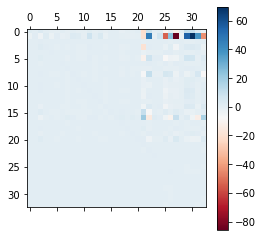

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Casos,1.243871,0.002744,2.483460,0.110556,-0.184476,-0.383541,0.379105,-1.199546,0.269920,-0.099472,...,0.888173,1.495919,-10.572233,-1.135183,-11.717570,-0.513666,10.765996,10.875061,2.471841,-1.994225
test coresp,-2.661696,0.850246,-3.883710,2.339994,-2.945558,0.576219,-1.526204,-0.687330,2.856625,2.186565,...,-0.832965,7.822994,-53.570200,23.994016,-85.779718,-3.142838,55.068305,69.863628,38.239930,-43.511418
Tasa de positividad (%),0.008201,0.000632,1.028058,-0.004942,-0.016254,-0.010579,0.005845,-0.021617,0.001937,0.005694,...,0.006534,-0.029448,0.214381,-0.057568,0.121274,0.043770,-0.129706,-0.157705,-0.032667,-0.003160
Asintomáticos,0.143955,-0.002877,1.772696,0.896668,0.004208,-0.145635,0.461580,-0.437951,0.329846,-0.165194,...,0.006384,0.334093,-2.127717,1.277454,-5.191668,0.119379,2.975419,3.584916,1.873588,-3.000884
Asintomáticos (%),0.006903,0.001595,0.493578,0.006923,0.817324,0.003832,0.108292,-0.016937,0.010688,-0.066828,...,-0.234330,-0.103137,0.843262,1.050999,-0.148168,0.082938,-0.610507,-0.314145,0.432333,-1.023079
Zaragoza,0.327294,0.002849,1.193109,0.069957,0.177643,0.522158,0.414585,-0.780021,0.177839,-0.143270,...,1.065041,1.097752,-8.079932,-3.948853,-4.877286,-0.542616,7.466106,6.085245,-1.127556,2.881557
Zaragoza (%),0.004623,-0.000118,-0.215988,-0.002036,0.054632,-0.002791,0.909553,0.002856,-0.009003,0.010410,...,0.083758,-0.075714,0.613006,-0.829515,0.834036,0.147891,-0.399503,-0.627774,-0.255352,0.560845
1 a 14 años,0.006016,0.000257,0.459072,0.048414,-0.025233,-0.051060,0.093301,0.775604,0.043074,0.047243,...,0.109339,0.162903,-0.916704,-0.621379,-0.849057,0.043889,1.011153,0.904523,0.046136,0.215538
15 a 24 años,0.067817,0.005130,1.075030,0.049128,-0.375167,-0.079163,0.033447,-0.308308,0.898780,0.017981,...,-0.804577,-0.809986,5.621395,4.653491,-3.442112,1.073653,-2.738698,-0.549230,5.308648,-8.220731
25 a 34 años,0.026276,0.000455,0.453435,0.006123,0.036359,-0.036153,0.062664,-0.144656,0.075958,0.857141,...,0.085475,0.203108,-1.591715,0.152982,-1.414124,-0.207403,1.320182,1.395543,0.192962,-0.169164


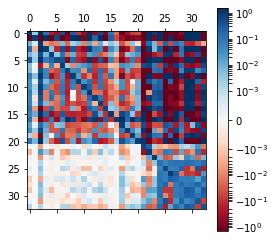

In [26]:
A = G.loc[:,celdas]
B = G.loc[:,entradas]
#D = G.loc[:,salidas]
#A_tilde[:11,:11].round(0).astype(int)

#import matplotlib.pyplot as plt
import matplotlib.colors as colors

plt.matshow(A, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()
A

(33, 388) = (33, 33)·(33, 33)·(33, 388)
CPU times: user 41.7 ms, sys: 27.2 ms, total: 68.9 ms
Wall time: 11.2 ms


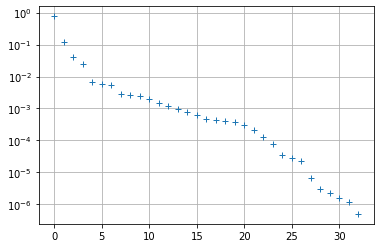

In [27]:
%%time
U_hat,kS_hat,V_hat_star = np.linalg.svd(X_prima,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_hat = pd.DataFrame(np.diag(kS_hat),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

V_hat_star = pd.DataFrame(V_hat_star,
                            columns=X_prima.columns,
                            index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                           )

U_hat = pd.DataFrame(U_hat,index=X_prima.index,
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],)

V_hat = V_hat_star.T


print("{} = {}·{}·{}".format(X_prima.shape,U_hat.shape,Sigma_hat.shape,V_hat_star.shape))
#plt.plot(Sigma/np.sum(Sigma),'+')
plt.plot(kS_hat/kS_hat.sum(),'+')

plt.yscale('symlog', linthresh=1.e-22)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,200)
plt.grid()

In [28]:
#GOTO0
thresh = 1e-6#6
#np.where(kS_hat/kS_hat.sum()<thresh)[0][0]
try:
    print(np.where(kS_hat/kS_hat.sum()<thresh)[0][0])#7#33#25#41#65#11#43#33  )
except:
    print(len(kS_hat))

32


In [29]:
r=len(kS_hat)
try:
    r = np.where(kS_hat/kS_hat.sum()<thresh)[0][0]#7#33#25#41#65#11#43#33  
except:
    r=len(kS_hat)
corRed = ['$\tilde x^{{{}}}$'.format(i) for i in range(r)]
U_hat.loc[:,corRed]

,$\tilde x^{0}$,$\tilde x^{1}$,$\tilde x^{2}$,$\tilde x^{3}$,$\tilde x^{4}$,$\tilde x^{5}$,$\tilde x^{6}$,$\tilde x^{7}$,$\tilde x^{8}$,$\tilde x^{9}$,...,$\tilde x^{22}$,$\tilde x^{23}$,$\tilde x^{24}$,$\tilde x^{25}$,$\tilde x^{26}$,$\tilde x^{27}$,$\tilde x^{28}$,$\tilde x^{29}$,$\tilde x^{30}$,$\tilde x^{31}$
Casos,-0.118717,0.244770,-0.178448,-0.671474,0.069020,0.040464,-0.044435,0.403730,-0.063394,0.145422,...,-0.045283,-0.004731,-0.007338,-0.009953,-0.004947,-0.002999,-0.001344,-0.000179,-3.303463e-04,-0.000004
test coresp,-0.888970,0.331750,-0.075529,0.303510,0.009033,-0.019441,-0.002171,0.010796,-0.003176,-0.029305,...,-0.004497,-0.000476,0.000812,-0.000044,-0.000047,0.000068,-0.000026,-0.000006,1.301046e-05,-0.000030
Tasa de positividad (%),-0.003495,0.000427,-0.002200,-0.023803,-0.011167,0.002875,0.015325,0.024908,0.033470,0.007871,...,-0.945324,-0.073797,0.197107,0.012035,-0.031198,-0.009311,-0.005712,0.007297,4.489724e-03,-0.006628
Asintomáticos,-0.059944,0.132673,-0.110573,-0.338627,0.046671,-0.168046,-0.374393,-0.744540,-0.224452,0.059293,...,-0.026889,-0.000583,0.007651,0.001801,-0.000807,-0.000079,0.000364,0.000267,3.755880e-04,0.000037
Asintomáticos (%),-0.014327,-0.023096,0.001941,0.004516,0.024306,-0.038858,-0.071157,-0.124748,-0.172189,0.074342,...,0.043822,-0.000261,-0.019233,-0.022000,0.005351,0.002034,-0.000327,-0.000411,-1.243552e-03,-0.000746
Zaragoza,-0.083103,0.155088,-0.122109,-0.409539,0.018142,0.179578,0.316788,-0.133099,0.347678,-0.163401,...,0.057897,-0.021472,0.000425,0.015395,0.000017,-0.000311,0.000937,0.000032,-9.004883e-05,-0.000210
Zaragoza (%),-0.020789,-0.041649,0.005321,0.033185,0.045562,0.169352,0.168049,-0.152231,0.010033,0.229824,...,-0.141638,0.043089,0.005562,-0.029249,0.004323,-0.004532,0.000245,0.000755,-4.448679e-04,0.000250
1 a 14 años,-0.014350,0.022858,-0.029309,-0.037622,0.076315,-0.319923,-0.102010,0.024352,0.460513,0.443535,...,0.096259,0.038161,-0.008886,-0.006715,0.002847,-0.003009,0.000056,0.001099,5.692522e-04,0.000668
15 a 24 años,-0.018245,0.035707,-0.195436,-0.117483,-0.829025,0.058214,0.128973,0.080543,-0.203528,-0.030970,...,0.062706,0.027172,0.013073,-0.007047,0.014422,0.002629,0.001049,0.000188,-1.474600e-05,0.000138
25 a 34 años,-0.014659,0.031231,-0.068461,-0.084985,-0.133436,-0.037710,-0.016995,-0.099592,0.098368,0.099625,...,0.048786,0.025421,-0.029676,0.012064,0.000267,0.002520,0.001987,0.000827,-6.470304e-04,0.000452


In [30]:
U_hat_r = U_hat.loc[:,corRed]
Sigma_hat_r = Sigma_hat.loc[corRed,corRed]

Sigma_hat_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_hat)),
                              1./kS_hat
                             ),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

Sigma_hat_inv_r = Sigma_hat_inv.loc[corRed,corRed]
V_hat =   V_hat_star.T
V_hat_r = V_hat.loc[:,corRed]

$$ \tilde A \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_1^* \hat U_r$$
$$ \tilde B \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_2^* $$

$$\tilde x_{k+1} = \tilde A\tilde x_k + \tilde B u_k $$
$$ Con: x  \tilde = \hat U_r \tilde x; \tilde x = \hat U_r^* x$$

$$ x_{k+1} = A_{nxn}x_k+B_{nx1}u_k $$

$$\tilde x_{k+1} = \tilde A_{rxr}\tilde x_k + \tilde B_{rx1} u_k $$

$$ x_{k+1} \tilde = \hat U_{nxr} \tilde x_{k+1} $$

In [31]:
A_tilde = U_hat_r.T.dot(A).dot(U_hat_r.loc[celdas])
B_tilde = U_hat_r.T.dot(B)

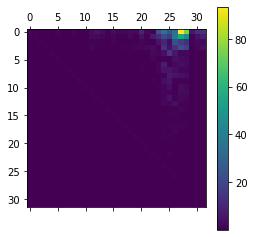

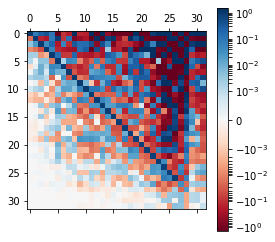

In [32]:
plt.matshow(np.absolute(A_tilde))#, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A_tilde, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()

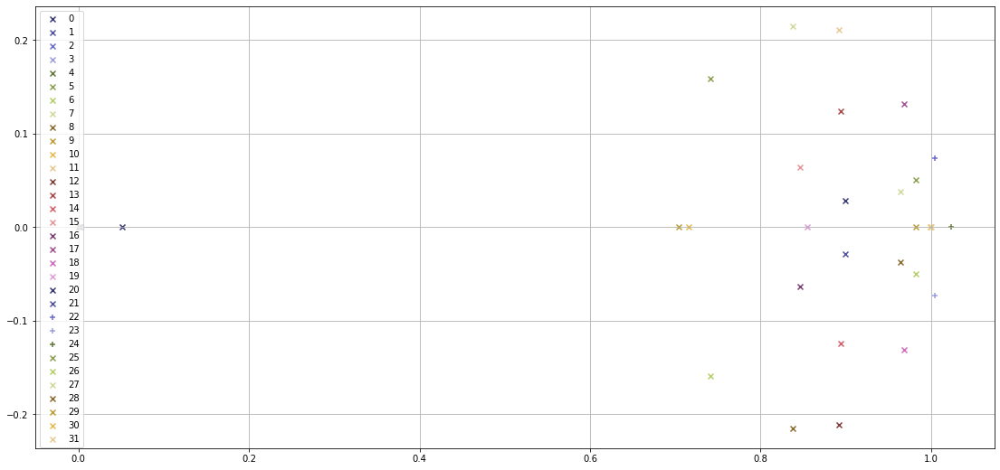

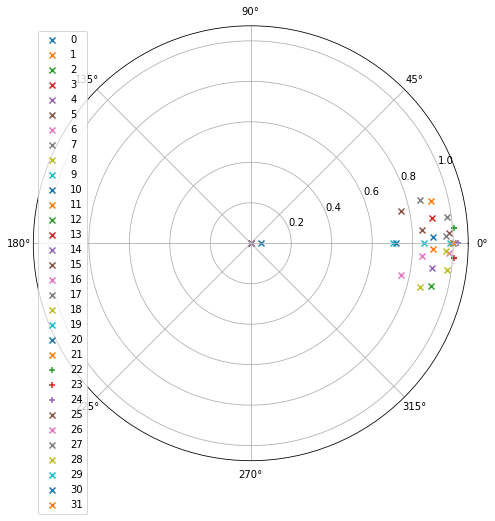

In [33]:
Lambda,W = np.linalg.eig(A_tilde)
colores = plt.cm.tab20b.colors
colores = colores + colores

fig = plt.figure(figsize=(19,9))
for i in range(len(Lambda)):
    if np.abs(Lambda[i]) >= 1:
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='+')
    else:    
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='x')
plt.legend(loc=2)
plt.grid()
plt.show()

#fig, ax = plt.subplots(figsize=(9, 9))
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='polar')
j = 0
for i in Lambda:
    if np.abs(i) > 1:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='+',label=j)
    else:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='x',label=j)
    j+=1
plt.legend(loc=2)
plt.show()

In [34]:
X_interp = A.dot(Omega.loc[celdas])
puntos_int = X_interp.T.shift(1)
display(puntos.shift(-1).tail())
display(puntos_int.tail())

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-29,4.0,77.571429,2167.428571,1517.428571,3.624286,45.238571,58.428571,15.285714,4.571429,9.285714,...,41.026284,87.763711,88.963140,81.252404,86.157682,89.080979,88.621371,89.219924,91.187790,88.956481
2021-09-30,4.0,74.000000,1983.857143,1517.714286,3.815714,42.888571,56.857143,14.714286,4.571429,8.285714,...,40.902469,87.758101,88.955166,81.248714,86.151835,89.074427,88.616313,89.216208,91.183880,88.949737
2021-10-01,4.0,73.285714,1884.428571,1518.857143,4.327143,42.061429,56.142857,14.857143,4.714286,8.285714,...,40.778655,87.752547,88.947116,81.244908,86.145988,89.067803,88.611394,89.212411,91.179758,88.943754
2021-10-02,4.0,70.571429,1859.571429,1520.428571,4.140000,41.758571,54.142857,13.714286,4.428571,8.428571,...,40.654854,87.747197,88.939684,81.241333,86.140041,89.061037,88.606612,89.208937,91.175954,88.937961
2021-10-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-29,85.623736,2263.452669,3.426127,51.698457,57.768718,57.335650,72.928038,16.060337,17.330397,11.379907,...,41.378920,87.764968,88.918738,81.259898,86.140963,89.064747,88.640899,89.242362,91.182486,88.969693
2021-09-30,82.001368,2294.723281,3.162272,49.412109,58.026204,53.468436,72.428739,14.112504,17.028926,10.522927,...,41.237203,87.759144,88.906423,81.256348,86.138877,89.065934,88.639647,89.239452,91.178925,88.954873
2021-10-01,86.919208,2325.019464,3.187833,52.523038,59.345153,57.066620,72.008341,15.073285,17.307743,11.014358,...,41.104890,87.751290,88.893533,81.251276,86.133822,89.062647,88.637980,89.233456,91.172449,88.938540
2021-10-02,91.501749,2335.437830,3.257547,54.320770,58.710319,62.179516,74.227520,15.947298,17.710459,12.015184,...,40.978030,87.743215,88.883342,81.244549,86.134021,89.058194,88.635258,89.225815,91.165397,88.926477
2021-10-03,87.892313,2173.365898,3.298229,53.103309,57.951405,59.534213,75.442596,15.630880,17.234827,11.064033,...,40.856894,87.736962,88.884457,81.236551,86.132370,89.046271,88.627150,89.212286,91.157247,88.931447


In [35]:
#for i in variables:
#    fig, ax = plt.subplots(figsize=(15,6))
#    #Omega.T[[i]].plot(ax=ax,label='{} interpolado'.format(i))
#    X_prima.T[[i]].plot(ls='-',ax=ax,label='{} interpolado'.format(i))
#    X_interp.T[[i]].plot(ls='--',ax=ax,label='{} interpolado'.format(i))
#    plt.grid()
#    plt.legend()
#    plt.show()

In [36]:
(X_interp-X_prima).divide(X_prima/100.).T.describe()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
count,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,...,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000
mean,7.143715,5.890596,-0.316419,10.675034,2.881337,3.760956,-1.245526,1.566130,47.900953,8.764071,...,0.165022,-0.008052,-0.066600,0.002084,-0.019543,-0.020223,0.037469,0.018852,-0.025191,-0.029007
std,6.425776,3.809696,4.288479,10.459094,3.857977,5.505984,1.856506,6.289918,48.395002,8.646004,...,0.209882,0.008715,0.027231,0.018605,0.017867,0.015227,0.042429,0.029712,0.013365,0.056815
min,-6.386958,-4.569618,-23.778129,-11.266881,-5.705132,-11.784266,-8.682258,-18.497260,-7.423954,-4.840580,...,-0.056844,-0.028988,-0.130504,-0.036232,-0.061801,-0.052665,-0.041058,-0.040085,-0.057974,-0.145474
25%,2.497583,3.481924,-2.795246,3.205169,0.174538,0.177068,-2.187669,-2.224278,17.063449,2.269298,...,-0.000258,-0.012409,-0.086849,-0.012269,-0.027788,-0.030095,0.005157,-0.005962,-0.033320,-0.085167
50%,5.972184,5.270873,-0.071250,9.032370,2.298281,3.086532,-1.147970,1.046463,36.610738,6.757991,...,0.062950,-0.007538,-0.066065,0.006082,-0.017722,-0.023527,0.026576,0.020907,-0.025717,-0.020249
75%,10.456476,8.172302,2.618361,15.637522,5.347614,6.990223,-0.274841,4.909234,64.835907,13.232749,...,0.330243,-0.003975,-0.045276,0.014131,-0.008689,-0.009052,0.081326,0.044005,-0.015822,0.015229
max,28.335207,21.626116,12.460590,49.468393,19.564716,22.926981,8.854606,25.625499,313.516419,45.010840,...,0.745907,0.112788,0.027856,0.111657,0.125108,0.082648,0.159269,0.112041,0.062200,0.193076


In [37]:
x1 = puntos[variables].T.iloc[:,-12]
display(x1)
display(puntos[variables].T.iloc[:,-11])
A.dot(x1)

Casos                          84.571429
test coresp                  1931.857143
Tasa de positividad (%)         4.472857
Asintomáticos                  48.507143
Asintomáticos (%)              57.571429
Zaragoza                       58.857143
Zaragoza (%)                   67.823586
1 a 14 años                    15.714286
15 a 24 años                    6.142857
25 a 34 años                    9.428571
35 a 44 años                   10.285714
45 a 54 años                    9.857143
55 a 64 años                    8.714286
65 a 74 años                    3.571429
75 años o más                  17.142857
Camas Ocup                    131.857143
Camas libres                 1531.142857
Camas (%)                       8.646674
UCI ocupadas                   29.142857
UCI libres con resp            98.571429
UCI (%)                        29.609444
Rs                              0.783171
Rd                              1.004701
Inoculados                     42.225758
Total Casos     

Casos                          84.714286
test coresp                  1986.714286
Tasa de positividad (%)         4.370000
Asintomáticos                  48.964286
Asintomáticos (%)              58.000000
Zaragoza                       59.000000
Zaragoza (%)                   67.873229
1 a 14 años                    17.142857
15 a 24 años                    6.000000
25 a 34 años                    9.428571
35 a 44 años                   10.000000
45 a 54 años                    8.857143
55 a 64 años                    8.285714
65 a 74 años                    4.000000
75 años o más                  17.428571
Camas Ocup                    125.714286
Camas libres                 1531.428571
Camas (%)                       8.218954
UCI ocupadas                   28.000000
UCI libres con resp            99.714286
UCI (%)                        28.132796
Rs                              0.824031
Rd                              1.059543
Inoculados                     42.057203
Total Casos     

Casos                          90.852661
test coresp                  2091.360580
Tasa de positividad (%)         4.149427
Asintomáticos                  56.012753
Asintomáticos (%)              58.456969
Zaragoza                       56.826272
Zaragoza (%)                   67.068493
1 a 14 años                    14.042619
15 a 24 años                   18.937089
25 a 34 años                   10.992689
35 a 44 años                    8.442574
45 a 54 años                    6.912845
55 a 64 años                    6.419797
65 a 74 años                    2.380583
75 años o más                  14.750652
Camas Ocup                    125.030322
Camas libres                 1505.560364
Camas (%)                       8.974161
UCI ocupadas                   26.680540
UCI libres con resp           101.062291
UCI (%)                        23.679023
Rs                              0.862371
Rd                              1.153772
Inoculados                     42.181961
Total Casos     

,Alarma,Festivo,Reuniones,VacunasD,Vacunas,Casos,Lectivo
2021-09-26,1.0,0.0,0.0,0.000,0.003,41.0,0.0
2021-09-27,1.0,0.0,0.0,2.347,1.448,84.0,0.0
2021-09-28,1.0,0.0,0.0,0.000,4.818,80.0,0.0
2021-09-29,1.0,0.0,0.0,0.000,9.867,100.0,0.0
2021-09-30,1.0,0.0,0.0,0.000,7.186,101.0,0.0
2021-10-01,1.0,0.0,0.0,0.000,4.692,60.0,0.0
2021-10-02,1.0,0.0,0.0,0.000,0.000,47.0,0.0
2021-10-03,1.0,0.0,0.0,0.000,0.000,22.0,0.0
2021-10-04,0.0,0.0,0.0,NaN,0.926,67.0,1.0
2021-10-05,0.0,0.0,0.0,NaN,3.094,81.0,1.0


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-10-02,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,0.0,1.0,4.002000
2021-10-03,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,0.0,1.0,4.001571
2021-10-04,0.857143,0.000000,0.285714,0.714286,0.857143,0.142857,0.0,1.0,3.927000
2021-10-05,0.714286,0.000000,0.285714,0.714286,0.714286,0.285714,0.0,1.0,3.680714
2021-10-06,0.571429,0.000000,0.285714,0.714286,0.571429,0.428571,0.0,1.0,3.439143
2021-10-07,0.428571,0.000000,0.285714,0.714286,0.428571,0.571429,0.0,1.0,2.417857
2021-10-08,0.285714,0.000000,0.285714,0.714286,0.285714,0.714286,0.0,1.0,2.844286
2021-10-09,0.142857,0.000000,0.285714,0.714286,0.285714,0.714286,1.0,1.0,2.844286
2021-10-10,0.000000,0.000000,0.285714,0.714286,0.285714,0.714286,2.0,1.0,2.844429
2021-10-11,0.000000,0.000000,0.285714,0.714286,0.428571,0.571429,3.0,1.0,2.901429


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-10-02,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,0.0,1.0,4.002000
2021-10-03,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,0.0,1.0,4.001571
2021-10-04,0.857143,0.000000,0.285714,0.714286,0.857143,0.142857,0.0,1.0,3.927000
2021-10-05,0.714286,0.000000,0.285714,0.714286,0.714286,0.285714,0.0,1.0,3.680714
2021-10-06,0.571429,0.000000,0.285714,0.714286,0.571429,0.428571,0.0,1.0,3.439143
2021-10-07,0.428571,0.000000,0.285714,0.714286,0.428571,0.571429,0.0,1.0,2.417857
2021-10-08,0.285714,0.000000,0.285714,0.714286,0.285714,0.714286,0.0,1.0,2.844286
2021-10-09,0.142857,0.000000,0.285714,0.714286,0.285714,0.714286,1.0,1.0,2.844286
2021-10-10,0.000000,0.000000,0.285714,0.714286,0.285714,0.714286,2.0,1.0,2.844429
2021-10-11,0.000000,0.000000,0.285714,0.714286,0.428571,0.571429,3.0,1.0,2.901429


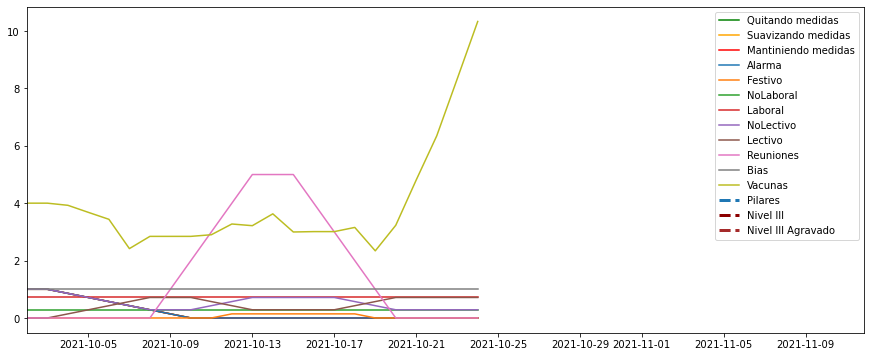

In [38]:
#x1 = puntos.loc[pd.date_range('2020-9-07',periods=83,freq='d')].copy()
x1 = puntos.loc['2020-10-21':].copy() #goto0
#x1 = puntos.loc['2020-10-7':].copy() #goto0
##x1 = puntos.loc['2020-10-1':].copy() #goto0
##x1 = puntos.loc['2020-11-1':].copy()
diasCalc = 21
x1 = puntos.iloc[-15:].copy()
#x1 = puntos.iloc[-29:].copy()
x1 = puntos.iloc[-8:].copy()
#x1 = puntos.iloc[-1:].copy()


#x1 = puntos.loc['2021-7-1':].copy() 
U1 = x1[entradas]
U1 = total.loc[x1.index,['Alarma']]
U0 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
                                                   
U2 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
x1_0 = x1.iloc[7].copy()
U1 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
##U0.loc['2021-9-26':,'Alarma'] = 1
##U1.loc['2021-9-26':,'Alarma'] = 1
##U2.loc['2021-9-26':,'Alarma'] = 1
###
###U0.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U1.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U2.loc['2020-12-5':'2020-12-9','Alarma'] = 0
U0.Alarma.fillna(method="ffill",inplace=True)
U1.Alarma.fillna(method="ffill",inplace=True)
U2.Alarma.fillna(method="ffill",inplace=True)
#U0.Alarma.fillna(0,inplace=True)
#U1.Alarma.fillna(0,inplace=True)
#U2.Alarma.fillna(0,inplace=True)


#U1.Alarma = total.Alarma
#U0.Alarma = total.Alarma
#U2.Alarma = total.Alarma

#U1 = Al1.copy()
U1['Festivo'] = total['Festivo']
U0['Festivo'] = total['Festivo']
U2['Festivo'] = total['Festivo']

U1['Reuniones'] = total['Reuniones']
U0['Reuniones'] = total['Reuniones']
U2['Reuniones'] = total['Reuniones']

U1['VacunasD'] = total['VacunasD']
U0['VacunasD'] = total['VacunasD']
U2['VacunasD'] = total['VacunasD']


U1['Vacunas'] = total['Vacunas']
U0['Vacunas'] = total['Vacunas']
U2['Vacunas'] = total['Vacunas']

U1['Casos'] = total['Casos']
U0['Casos'] = total['Casos']
U2['Casos'] = total['Casos']




U1['Lectivo']   = total['Lectivo']

display(U1)

U1.Festivo.fillna(0,inplace=True)
#U1.loc['2021-04-23':'2021-04-24','Festivo']=1
U1.loc['2021-10-12','Festivo']=1
U0['Festivo'] = U1.Festivo
U2['Festivo'] = U1.Festivo

U1.Reuniones.fillna(0,inplace=True)
U1.loc['2021-09-17':'2021-09-18','Reuniones']=7
#U1.loc['2021-09-24':'2021-09-25','Reuniones']=7
U1.loc['2021-10-9':'2021-10-13','Reuniones']=7

U0['Reuniones'] = U1.Reuniones
U2['Reuniones'] = U1.Reuniones

for i in U0.index:
    if i in vacunasD.index:
        #display(i)
        U0.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U1.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U2.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
U0.VacunasD.fillna(1,inplace=True)
#U0.Vacunas = 0
U1.VacunasD.fillna(2,inplace=True)
U2.VacunasD.fillna(3,inplace=True)
for i in U0.index:
    if i in vacunas.index:
        #display(i)
        U0.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U1.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U2.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
U0.Vacunas.fillna(12,inplace=True)
#U0.Vacunas = 0
U1.Vacunas.fillna(14,inplace=True)
U2.Vacunas.fillna(16,inplace=True)
U0.Casos.fillna(100,inplace=True)
U1.Casos.fillna(100,inplace=True)
U2.Casos.fillna(100,inplace=True)


U0.loc[:,'Inoculados'] = U0.Vacunas.cumsum()/2# + U0.Casos.cumsum()
U1.loc[:,'Inoculados'] = U1.Vacunas.cumsum()/2# + U1.Casos.cumsum()
U2.loc[:,'Inoculados'] = U2.Vacunas.cumsum()/2# + U2.Casos.cumsum()

U1.loc[:,'Laboral'] = 1 #- total.Festivo/7
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Laboral' ] =0
U0['Laboral'] = U1.Laboral
U2['Laboral'] = U1.Laboral

U1.Lectivo.fillna(1,inplace=True)#llegan las vacaciones
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Lectivo' ] =0
U1.loc['2021-06-21':'2021-09-08','Lectivo']=0 #vacaciones
U1.loc['2021-10-9':'2021-10-13','Lectivo']=0
U0['Lectivo'] = U1.Lectivo
U2['Lectivo'] = U1.Lectivo

U1.loc[:,'NoLectivo'] = 1-U1.Lectivo
U0.loc[:,'NoLectivo'] = U1.NoLectivo
U2.loc[:,'NoLectivo'] = U1.NoLectivo

U1.loc[:,'NoLaboral'] = 1-U1.Laboral
U0.loc[:,'NoLaboral'] = U1.NoLaboral
U2.loc[:,'NoLaboral'] = U1.NoLaboral

U0['Bias'] = 1
U1['Bias'] = 1
U2['Bias'] = 1


U0 = U0.rolling(7,center=False).mean().copy().dropna()
U1 = U1.rolling(7,center=False).mean().copy().dropna()
U2 = U2.rolling(7,center=False).mean().copy().dropna()

fig, ax = plt.subplots(figsize=(15,6))
#highlight_datetimes(pd.concat([diario.loc['2020-9-7':],U1]).index.unique(), ax,items=False)

plt.plot(U0.index,U0.Alarma,axes=ax,c='green',label='Quitando medidas')
plt.plot(U1.index,U1.Alarma,axes=ax,c='orange',label='Suavizando medidas')
plt.plot(U2.index,U2.Alarma,axes=ax,c='r',label='Mantiniendo medidas')
for i in entradas:
    plt.plot(U1.index,U1[i],axes=ax,label=i)
    
ax.axvline(pd.Timestamp('2020-10-12'),lw=3,ls='--',label='Pilares')
ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
plt.legend()
plt.xlim(left=U0.index[0])

display(U2[entradas],U1[entradas])

In [39]:
import control as ct

#C = np.identity(len(A_tilde.columns))
C = U_hat_r.loc[celdas]
D = np.zeros((len(A_tilde.columns),len(B_tilde.columns)))

In [40]:
fsys_A_tilde = ct.ss(A_tilde,B_tilde,C,np.zeros((len(C.index),len(B_tilde.columns))),1)

In [41]:
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),x1[entradas].T.values
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0,0,1]))

array([[0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1.]])

In [42]:
%time
Ukk = U1.copy()
Ukk.Alarma=0
Ukk.Vacunas = 0
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=np.arange(len(Ukk.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(U1.index)),[0,0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=Ukk[entradas].T.values, 
                         #U=x1[[entradas]].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]).values)
noAction = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(noAction.T)

CPU times: user 1 µs, sys: 1 µs, total: 2 µs
Wall time: 2.15 µs


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-10-02,70.571429,1859.571429,4.140000,41.758571,60.571429,54.142857,76.234443,13.714286,4.428571,8.428571,...,40.654853,87.747358,88.939668,81.241312,86.140027,89.061028,88.606604,89.208874,91.175949,88.937936
2021-10-03,75.723593,1894.142491,4.051443,48.367536,61.367566,59.245630,77.368438,15.041536,10.423435,9.131317,...,40.604752,87.732650,88.942729,81.213682,86.166122,89.059024,88.607074,89.177801,91.148721,88.931799
2021-10-04,82.770809,1945.548420,3.893416,56.435447,62.225180,66.407723,78.605151,16.624278,15.584065,10.251285,...,40.555839,87.723329,88.937881,81.192261,86.168336,89.050654,88.594662,89.164264,91.136820,88.934236
2021-10-05,90.330786,2026.336915,3.574709,65.286490,63.005336,73.656685,79.696353,18.280011,20.237917,11.743712,...,40.508506,87.714147,88.930065,81.168399,86.166738,89.040712,88.579145,89.152765,91.128375,88.939569
2021-10-06,97.201501,2130.009026,3.095810,73.852553,63.650262,80.175407,80.667134,19.885860,24.162995,13.389681,...,40.462657,87.704552,88.920272,81.141670,86.164100,89.030159,88.564286,89.142011,91.120724,88.944571
2021-10-07,102.325512,2249.694052,2.463844,81.224513,64.116893,85.253993,81.539254,21.331792,27.175375,14.996286,...,40.418381,87.694620,88.908528,81.112769,86.160366,89.019224,88.550235,89.132073,91.113873,88.948953
2021-10-08,104.811925,2378.549747,1.690634,86.662502,64.376910,88.289733,82.328412,22.520189,29.140255,16.400260,...,40.375811,87.684491,88.894929,81.082500,86.155534,89.008129,88.537134,89.123087,91.107864,88.952542
2021-10-09,103.943666,2509.990239,0.791471,89.593840,64.414727,88.792080,83.044943,23.365984,29.972904,17.468465,...,40.335119,87.674359,88.879646,81.051716,86.149693,88.997105,88.525121,89.115218,91.102754,88.955277
2021-10-10,100.483993,2626.467365,-0.122353,89.241009,64.242361,87.669675,83.731792,23.944713,29.968359,17.932706,...,40.290243,87.665729,88.863132,81.023775,86.141872,88.988436,88.522698,89.111975,91.096892,88.951303
2021-10-11,94.469673,2726.308613,-1.037355,86.012848,63.894380,84.768890,84.353404,24.231265,29.057963,17.846169,...,40.241715,87.658419,88.845304,80.997881,86.134324,88.981621,88.522767,89.110963,91.092585,88.947330


In [43]:
%%time 
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U1[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


kControl = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(kControl.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U0[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


rellaxed = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(rellaxed.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U2[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


hard = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(hard.T)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-10-02,70.571429,1859.571429,4.140000,41.758571,60.571429,54.142857,76.234443,13.714286,4.428571,8.428571,...,40.654853,87.747358,88.939668,81.241312,86.140027,89.061028,88.606604,89.208874,91.175949,88.937936
2021-10-03,72.607427,1879.139114,3.706717,43.780167,60.542144,56.371499,76.824673,15.191703,2.673463,9.118400,...,40.531613,87.733994,88.939137,81.224466,86.148922,89.055005,88.593151,89.182554,91.156871,88.938401
2021-10-04,73.338974,1908.296408,3.206264,45.406651,60.455057,57.876412,77.505708,16.660684,-1.013068,9.381567,...,40.408932,87.723043,88.929808,81.218161,86.145165,89.044435,88.579299,89.166404,91.148357,88.933850
2021-10-05,72.370147,1957.454732,2.625302,46.546327,60.232956,57.489960,78.042176,17.944792,-4.818227,9.287606,...,40.285830,87.711775,88.919586,81.214443,86.138992,89.031670,88.559500,89.149112,91.141109,88.933502
2021-10-06,69.546284,2019.571898,1.985372,46.862047,59.938776,55.325298,78.483775,18.971512,-8.332080,8.837955,...,40.166309,87.700530,88.907470,81.213525,86.132853,89.018798,88.540222,89.132754,91.133475,88.930465
2021-10-07,65.035377,2090.077271,1.303876,46.171349,59.582182,51.670096,78.853159,19.696904,-11.187504,8.099884,...,40.050519,87.689498,88.894315,81.214578,86.127094,89.005788,88.520763,89.117075,91.125611,88.926713
2021-10-08,58.965263,2166.736170,0.589493,44.905002,59.359908,46.889918,79.262022,20.081695,-13.007213,7.127028,...,39.957821,87.679574,88.877853,81.218285,86.123568,88.994812,88.507380,89.105359,91.117960,88.915676
2021-10-09,52.020167,2247.021026,-0.142808,42.299749,58.899835,41.377568,79.555308,20.143494,-13.706991,6.119149,...,39.853545,87.669378,88.865855,81.219507,86.119435,88.981045,88.484450,89.089671,91.109945,88.917868
2021-10-10,45.522210,2317.132492,-0.784922,38.259051,58.333133,36.663969,79.862895,19.973652,-12.752908,4.931188,...,39.741678,87.660835,88.852283,81.222590,86.115551,88.970231,88.472790,89.079485,91.100665,88.910823
2021-10-11,40.193681,2380.520750,-1.334057,33.622442,57.703203,33.124584,80.153694,19.593838,-10.066708,3.783902,...,39.622910,87.653580,88.838425,81.224246,86.113266,88.961057,88.462962,89.071437,91.092513,88.904984


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-10-02,70.571429,1859.571429,4.140000,41.758571,60.571429,54.142857,76.234443,13.714286,4.428571,8.428571,...,40.654853,87.747358,88.939668,81.241312,86.140027,89.061028,88.606604,89.208874,91.175949,88.937936
2021-10-03,72.607427,1879.139114,3.706717,43.780167,60.542144,56.371499,76.824673,15.191703,2.673463,9.118400,...,40.531613,87.733994,88.939137,81.224466,86.148922,89.055005,88.593151,89.182554,91.156871,88.938401
2021-10-04,73.338974,1908.296408,3.206264,45.406651,60.455057,57.876412,77.505708,16.660684,-1.013068,9.381567,...,40.408932,87.723043,88.929808,81.218161,86.145165,89.044435,88.579299,89.166404,91.148357,88.933850
2021-10-05,72.370147,1957.454732,2.625302,46.546327,60.232956,57.489960,78.042176,17.944792,-4.818227,9.287606,...,40.285830,87.711775,88.919586,81.214443,86.138992,89.031670,88.559500,89.149112,91.141109,88.933502
2021-10-06,69.546284,2019.571898,1.985372,46.862047,59.938776,55.325298,78.483775,18.971512,-8.332080,8.837955,...,40.166309,87.700530,88.907470,81.213525,86.132853,89.018798,88.540222,89.132754,91.133475,88.930465
2021-10-07,65.035377,2090.077271,1.303876,46.171349,59.582182,51.670096,78.853159,19.696904,-11.187504,8.099884,...,40.050519,87.689498,88.894315,81.214578,86.127094,89.005788,88.520763,89.117075,91.125611,88.926713
2021-10-08,58.965263,2166.736170,0.589493,44.905002,59.359908,46.889918,79.262022,20.081695,-13.007213,7.127028,...,39.957821,87.679574,88.877853,81.218285,86.123568,88.994812,88.507380,89.105359,91.117960,88.915676
2021-10-09,52.020167,2247.021026,-0.142808,42.299749,58.899835,41.377568,79.555308,20.143494,-13.706991,6.119149,...,39.853545,87.669378,88.865855,81.219507,86.119435,88.981045,88.484450,89.089671,91.109945,88.917868
2021-10-10,45.522210,2317.132492,-0.784922,38.259051,58.333133,36.663969,79.862895,19.973652,-12.752908,4.931188,...,39.741678,87.660835,88.852283,81.222590,86.115551,88.970231,88.472790,89.079485,91.100665,88.910823
2021-10-11,40.193681,2380.520750,-1.334057,33.622442,57.703203,33.124584,80.153694,19.593838,-10.066708,3.783902,...,39.622910,87.653580,88.838425,81.224246,86.113266,88.961057,88.462962,89.071437,91.092513,88.904984


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-10-02,70.571429,1859.571429,4.140000,41.758571,60.571429,54.142857,76.234443,13.714286,4.428571,8.428571,...,40.654853,87.747358,88.939668,81.241312,86.140027,89.061028,88.606604,89.208874,91.175949,88.937936
2021-10-03,72.607427,1879.139114,3.706717,43.780167,60.542144,56.371499,76.824673,15.191703,2.673463,9.118400,...,40.531613,87.733994,88.939137,81.224466,86.148922,89.055005,88.593151,89.182554,91.156871,88.938401
2021-10-04,73.338974,1908.296408,3.206264,45.406651,60.455057,57.876412,77.505708,16.660684,-1.013068,9.381567,...,40.408932,87.723043,88.929808,81.218161,86.145165,89.044435,88.579299,89.166404,91.148357,88.933850
2021-10-05,72.370147,1957.454732,2.625302,46.546327,60.232956,57.489960,78.042176,17.944792,-4.818227,9.287606,...,40.285830,87.711775,88.919586,81.214443,86.138992,89.031670,88.559500,89.149112,91.141109,88.933502
2021-10-06,69.546284,2019.571898,1.985372,46.862047,59.938776,55.325298,78.483775,18.971512,-8.332080,8.837955,...,40.166309,87.700530,88.907470,81.213525,86.132853,89.018798,88.540222,89.132754,91.133475,88.930465
2021-10-07,65.035377,2090.077271,1.303876,46.171349,59.582182,51.670096,78.853159,19.696904,-11.187504,8.099884,...,40.050519,87.689498,88.894315,81.214578,86.127094,89.005788,88.520763,89.117075,91.125611,88.926713
2021-10-08,58.965263,2166.736170,0.589493,44.905002,59.359908,46.889918,79.262022,20.081695,-13.007213,7.127028,...,39.957821,87.679574,88.877853,81.218285,86.123568,88.994812,88.507380,89.105359,91.117960,88.915676
2021-10-09,52.020167,2247.021026,-0.142808,42.299749,58.899835,41.377568,79.555308,20.143494,-13.706991,6.119149,...,39.853545,87.669378,88.865855,81.219507,86.119435,88.981045,88.484450,89.089671,91.109945,88.917868
2021-10-10,45.522210,2317.132492,-0.784922,38.259051,58.333133,36.663969,79.862895,19.973652,-12.752908,4.931188,...,39.741678,87.660835,88.852283,81.222590,86.115551,88.970231,88.472790,89.079485,91.100665,88.910823
2021-10-11,40.193681,2380.520750,-1.334057,33.622442,57.703203,33.124584,80.153694,19.593838,-10.066708,3.783902,...,39.622910,87.653580,88.838425,81.224246,86.113266,88.961057,88.462962,89.071437,91.092513,88.904984


CPU times: user 33.3 ms, sys: 1.52 ms, total: 34.8 ms
Wall time: 34.1 ms


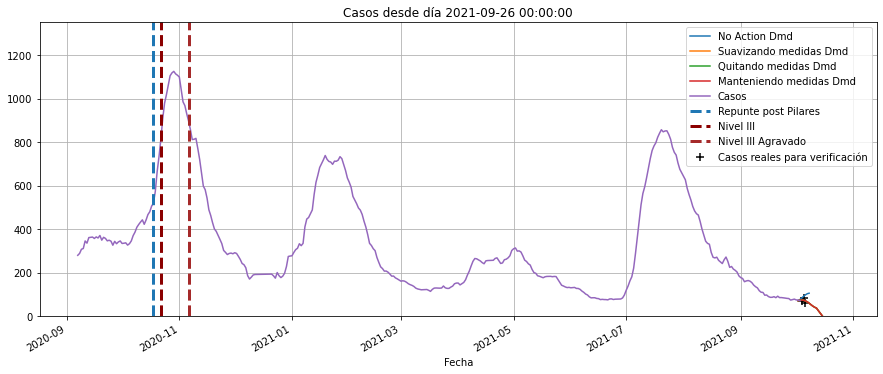

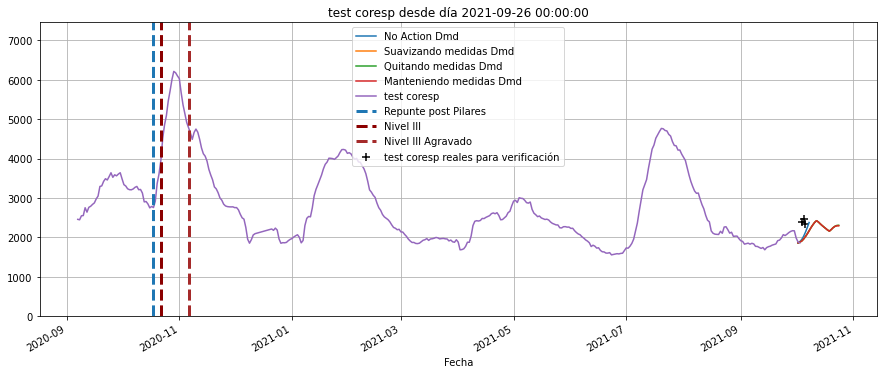

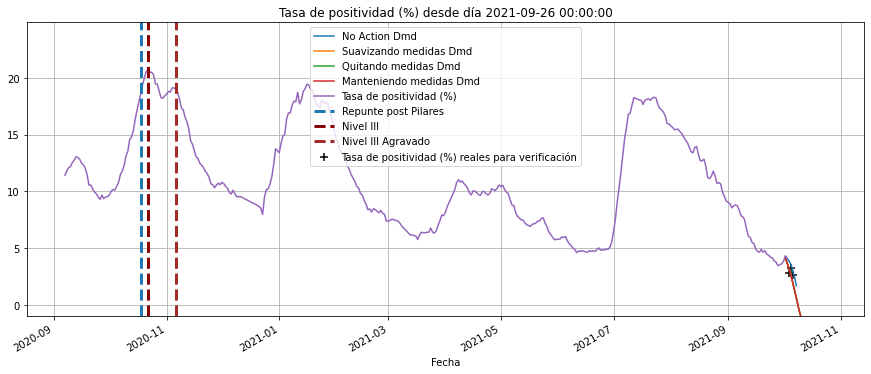

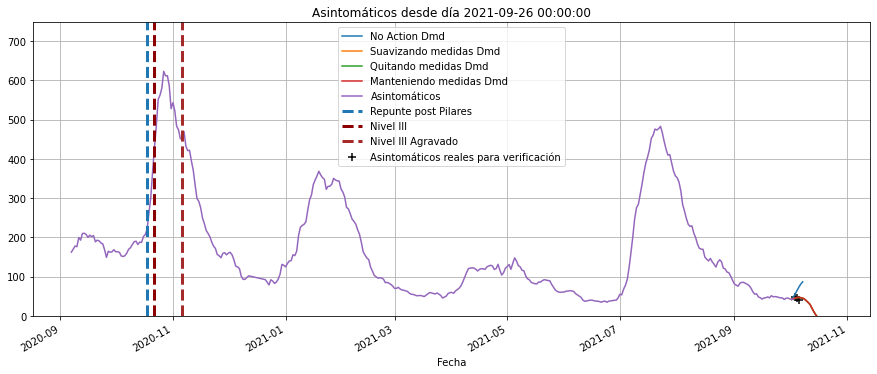

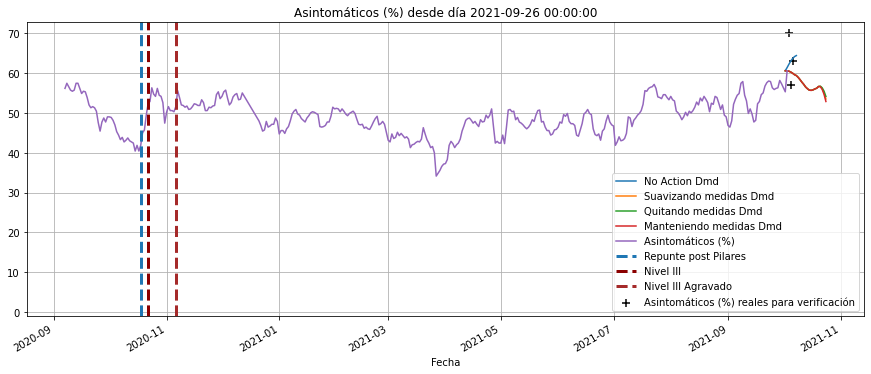

...

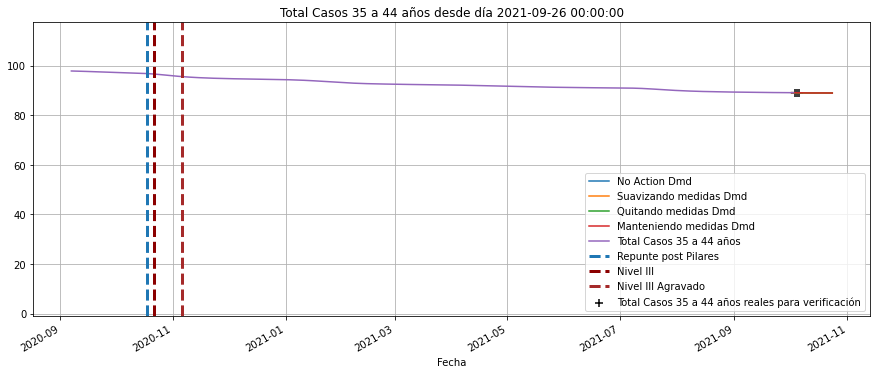

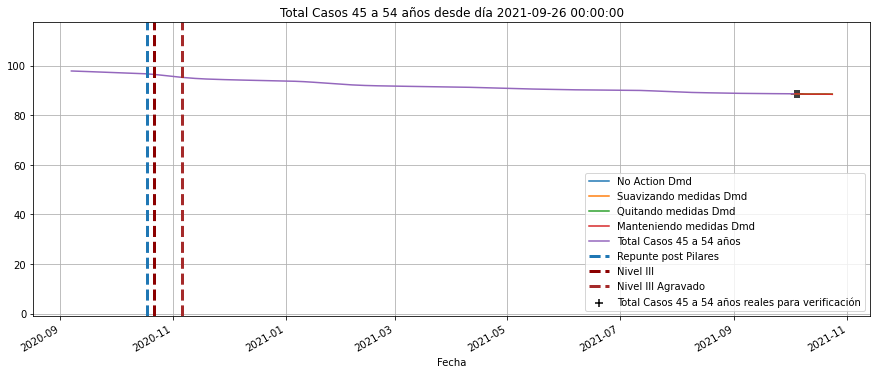

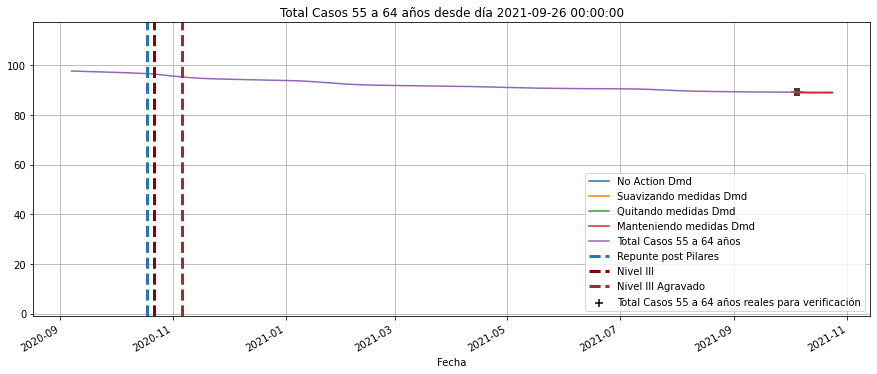

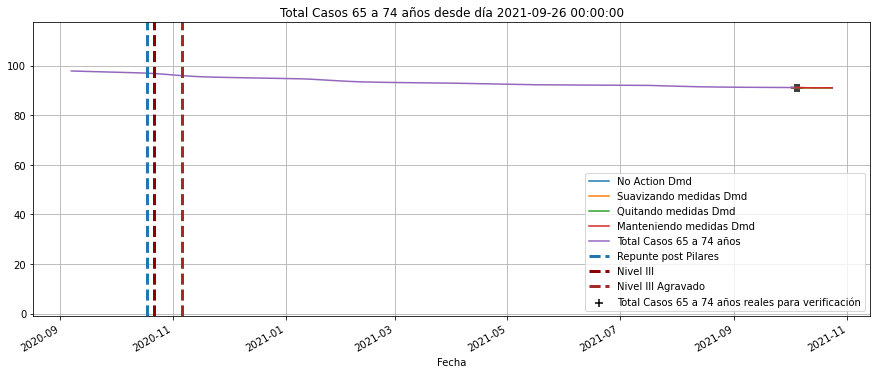

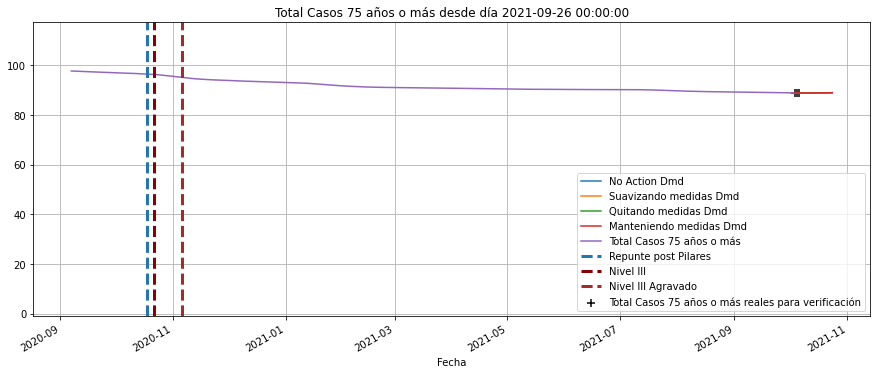

In [44]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    ax.plot(noAction.T.loc[:nuevos.index[-1]].index,
            noAction.T.loc[:nuevos.index[-1]][[i]],axes=ax,label='No Action Dmd')
    ax.plot(kControl.T.index,
            kControl.T[[i]],axes=ax,label='Suavizando medidas Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]],axes=ax,label='Quitando medidas Dmd')
    ax.plot(hard.T.index,
            hard.T[[i]],axes=ax,label='Manteniendo medidas Dmd')
    X_prima.T.shift(0).loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*X_prima.T.loc['2020-9-7':,i].max())
    plt.show()
  

In [45]:
import datetime as datetime

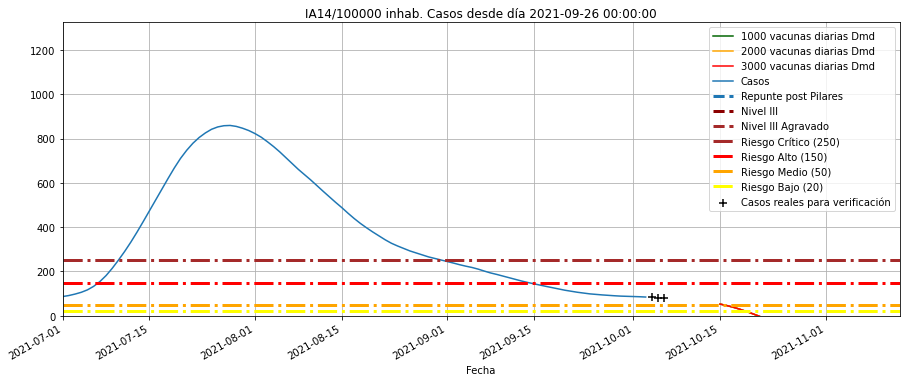

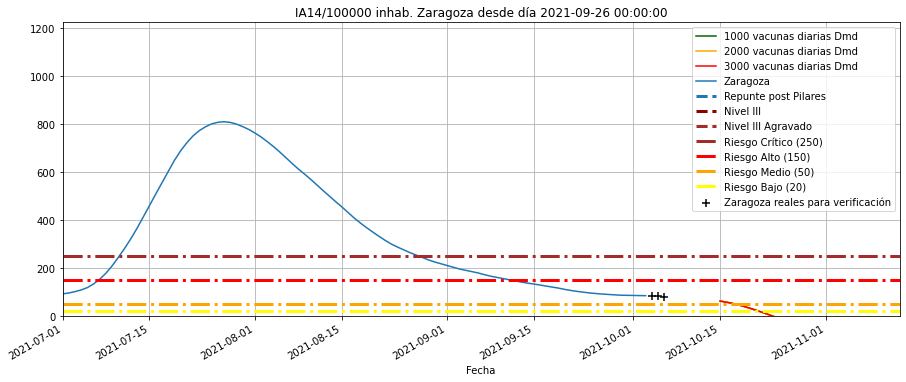

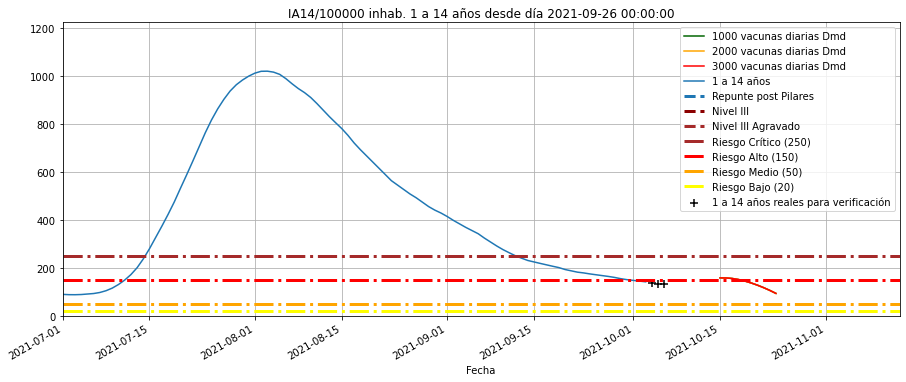

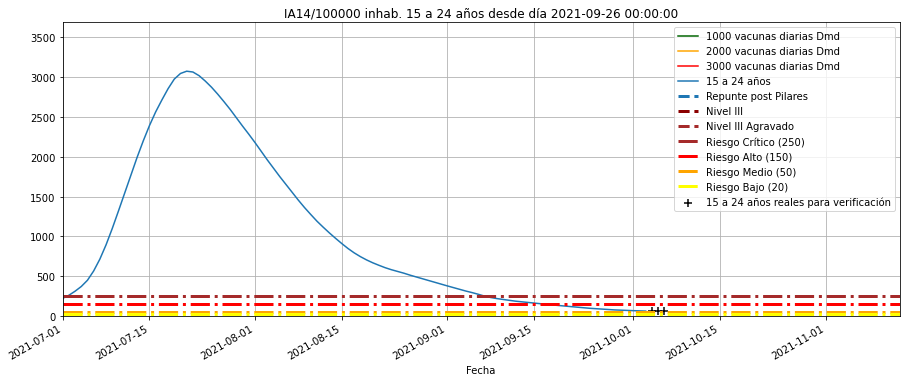

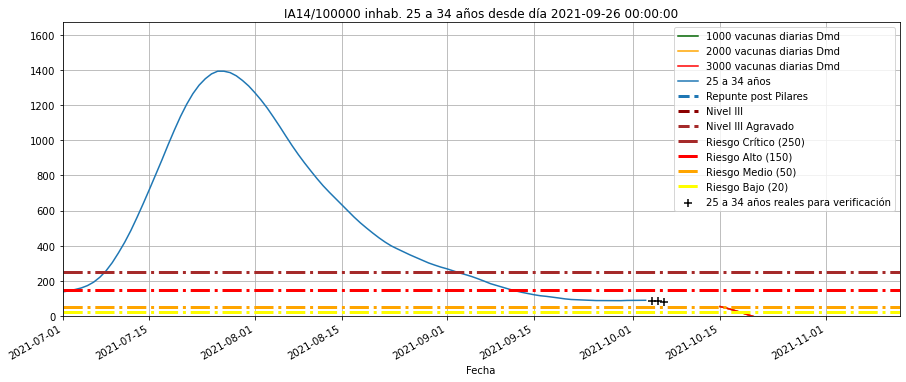

...

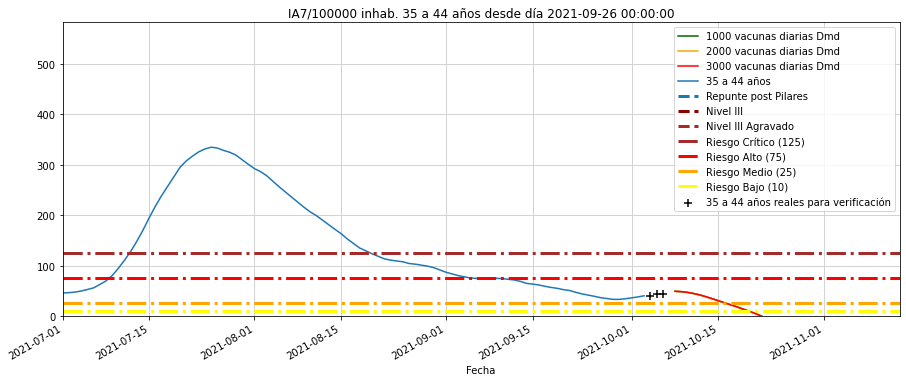

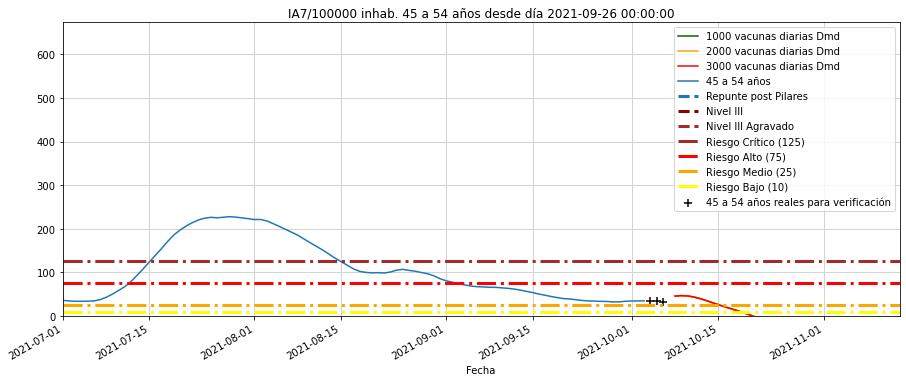

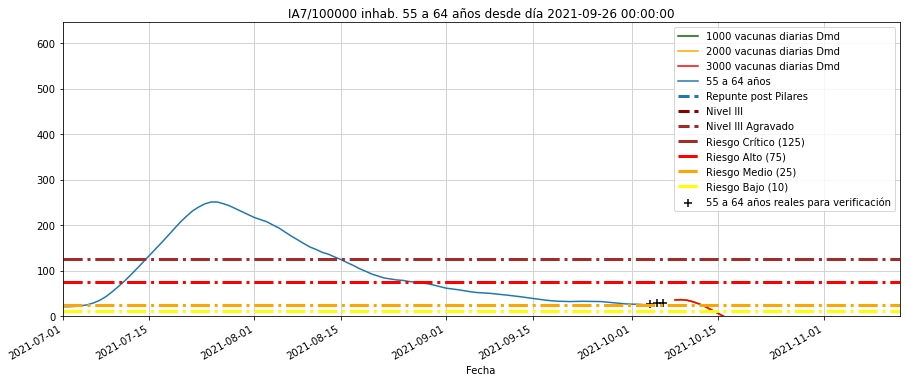

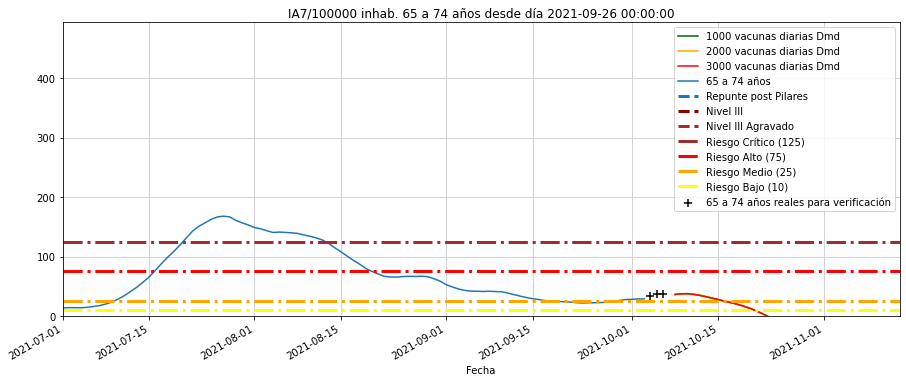

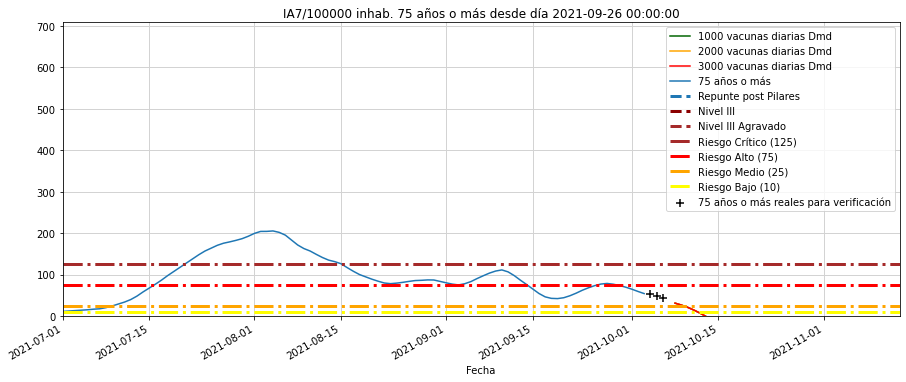

In [46]:
coef = {
    'Casos':13.19,
    #'test coresp':13,
    #'Nº de pacientes a los que se ha realizado pruebas':13,
    #'Asintomáticos':13,
    'Zaragoza':9.6,
    '1 a 14 años':1.58,
    '15 a 24 años':1.24,
    '25 a 34 años':1.42,
    '35 a 44 años':2.01,
    '45 a 54 años':2.06, 
    '55 a 64 años':1.77, 
    '65 a 74 años':1.35,
    '75 años o más':1.50,
}
for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]
            ).loc[nuevos.index[0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(250,lw=3,ls='-.',c='brown',label='Riesgo Crítico (250)')
    ax.axhline(150,lw=3,ls='-.',c='red',label='Riesgo Alto (150)')
    ax.axhline(50,lw=3,ls='-.',c='orange',label='Riesgo Medio (50)')
    ax.axhline(20,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (20)')
    plt.title("IA14/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).max())
    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()

for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #(pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1).T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(7,center=False).sum()/coef[i]
            ).loc[nuevos.index[-0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(125,lw=3,ls='-.',c='brown',label='Riesgo Crítico (125)')
    ax.axhline(75,lw=3,ls='-.',c='red',label='Riesgo Alto (75)')
    ax.axhline(25,lw=3,ls='-.',c='orange',label='Riesgo Medio (25)')
    ax.axhline(10,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (10)')
    plt.title("IA7/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    #plt.grid()
    plt.grid(which='minor',axis ='both', linestyle=':', linewidth='0.5', color='lightgrey')
    plt.grid(which='major',axis ='both', linewidth='1', color='lightgrey')
    plt.ylim(bottom=-1,
             top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).max())
    plt.ylim(bottom=.0*np.max([0,
                           np.min([total.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   kControl.T.loc[:,i].min()])]),
         top=1.1*np.max([total.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         kControl.T.loc[:,i].max()]))

    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()
  

In [47]:
pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)
#nuevos.T.shift(0).loc[X_prima.index[0]:]
#X_prima
i='Casos'
((pd.concat([diario.T,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]).loc[X_prima.T.index[-5]:].round(0)
nuevos.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-10-04,1,67.0,2402.0,0.0,2.79,46.90,45.0,7.0,6.0,4.0,...,40.339462,87.729233,88.917312,81.228070,86.122399,89.038673,88.591507,89.195929,91.157671,88.918206
2021-10-05,2,81.0,2462.0,0.0,3.29,46.17,58.0,16.0,4.0,4.0,...,40.243740,87.723093,88.908642,81.224841,86.119576,89.029698,88.587627,89.189143,91.150274,88.912223
2021-10-06,3,62.0,2343.0,0.0,2.65,39.06,40.0,11.0,6.0,8.0,...,39.990790,87.718394,88.902681,81.219997,86.113931,89.024713,88.584716,89.185184,91.145835,88.908899
2021-10-07,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39.989645,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-08,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39.752133,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
noAction2 = noAction *repartoDiaSemana.loc[noAction.T.index.dayofweek+1,kControl.index].T.values
kControl2 = kControl *repartoDiaSemana.loc[kControl.T.index.dayofweek+1,kControl.index].T.values
rellaxed2 = rellaxed *repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values
hard2 = hard *repartoDiaSemana.loc[hard.T.index.dayofweek+1,kControl.index].T.values
media2 = ((rellaxed.clip(lower=0)+kControl.clip(lower=0)+hard.clip(lower=0))/3.)*repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values

In [49]:
from matplotlib.dates import HourLocator, MonthLocator, YearLocator, WeekdayLocator

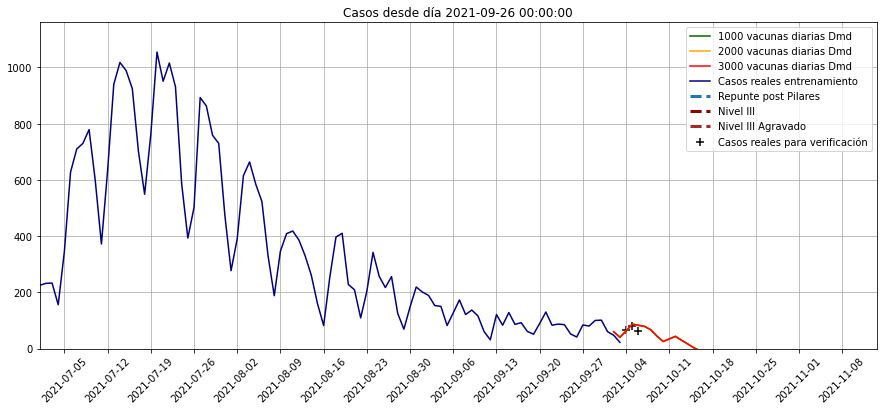

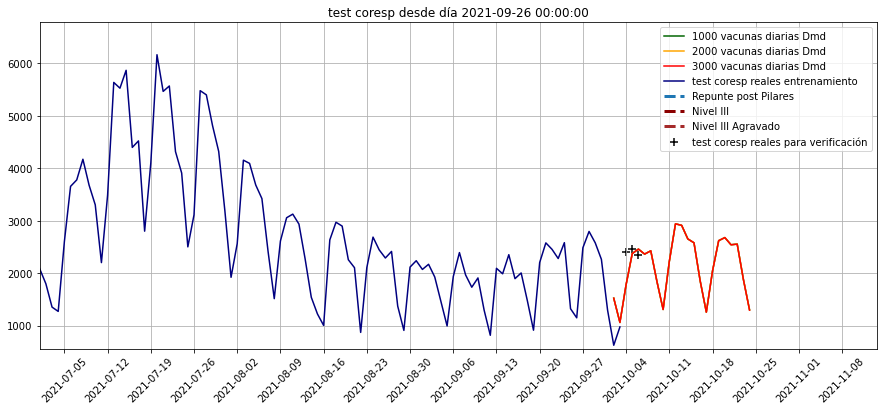

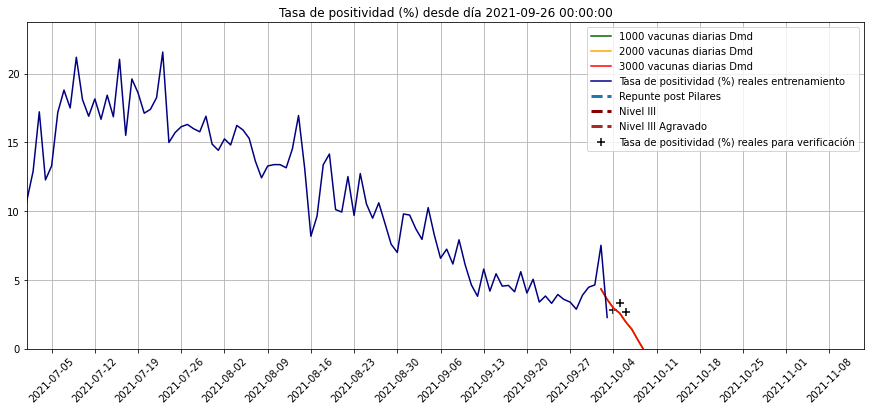

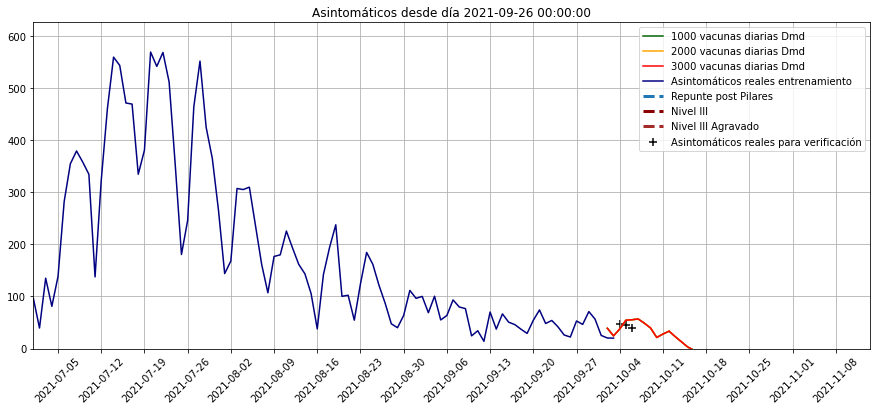

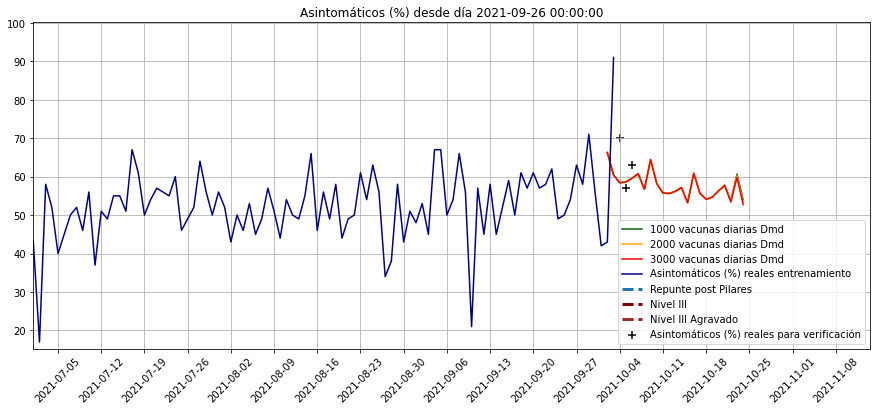

...

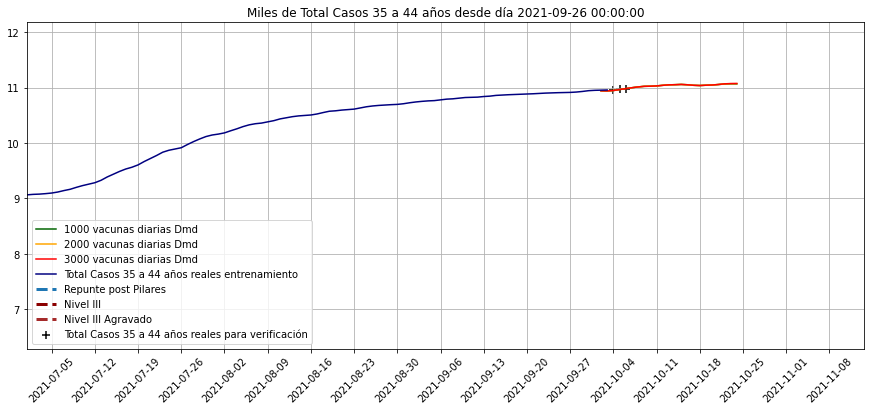

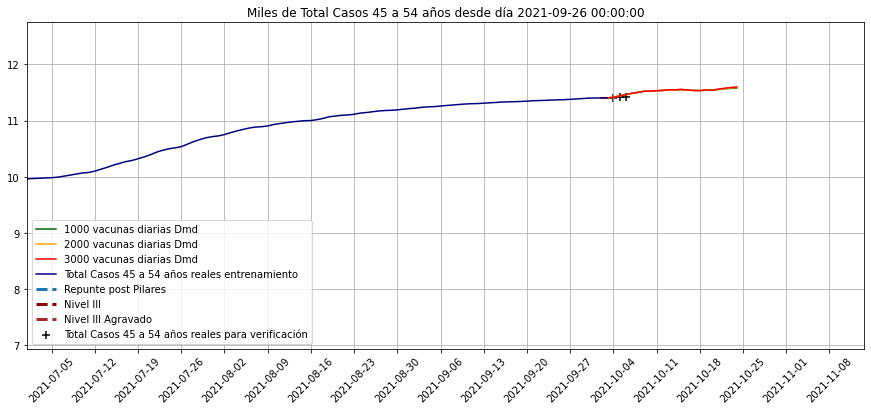

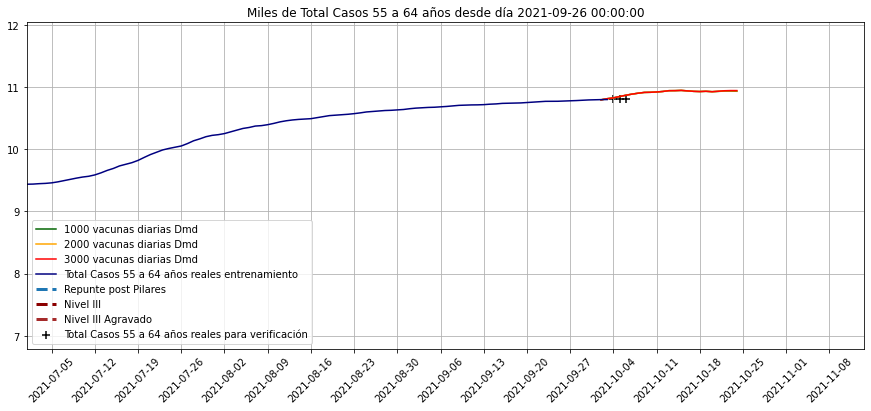

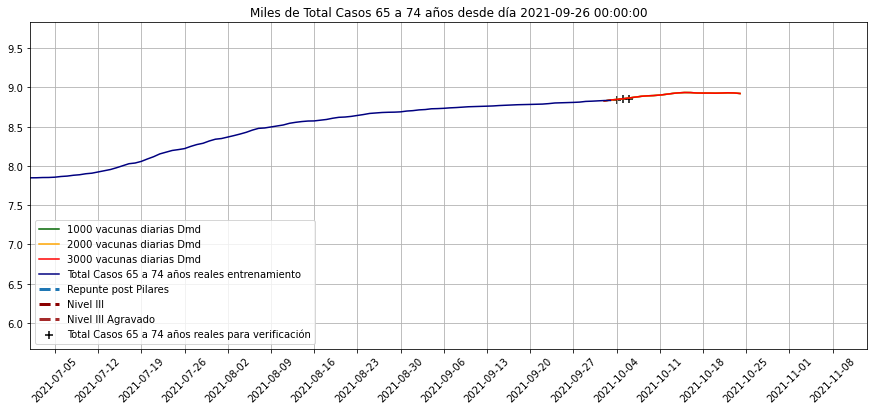

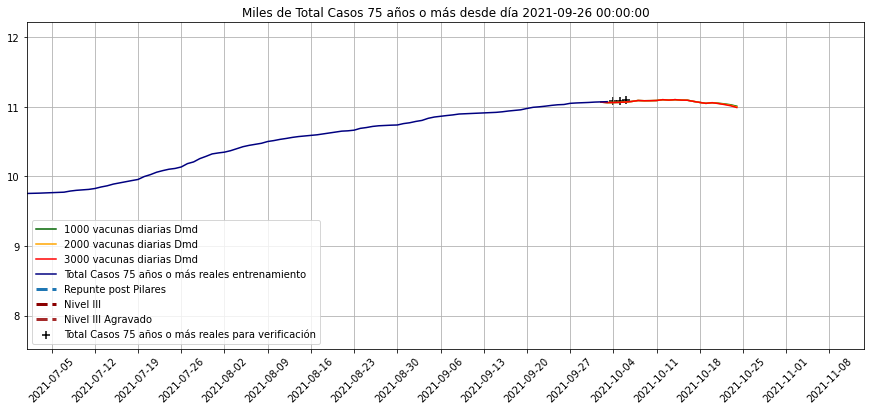

In [50]:
for i in kControl.T.columns[:-9]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=3.0*diario.loc['2021-2':,i].max())
    #plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.75*X_prima.T.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,
                               np.min([diario.loc['2021-2':,i].min(),
                                       #nuevos.loc['2021-2':,i].min(),
                                       kControl2.T.loc['2021-2':,i].min()])]),
             top=1.1*np.max([diario.loc['2021-2':,i].max(),
                                  #nuevos.loc['2021-2':,i].max(),
                                  kControl2.T.loc['2021-2':,i].max()]))


        
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
for i in kControl.T.columns[-9:]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            100-rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            100-kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            100-hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        100-diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            100-nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("Miles de {} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=1.1*diario.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,100-np.max([diario.loc['2021-2':,i].max(),
                                             #nuevos.loc['2021-2':,i].max(),
                                             kControl2.T.loc['2021-2':,i].max()])]),
             top=1.1*(100-np.min([diario.loc['2021-2':,i].min(),
                                  #nuevos.loc['2021-2':,i].min(),
                                  kControl2.T.loc['2021-2':,i].min()])))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
    

In [51]:
kControl2.index
kControl2.loc['Nº de pacientes a los que se ha realizado pruebas']=0

In [52]:
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas', 
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-10-4':'2021-10-10'].round(0).astype(int).T.sort_index(ascending=False).to_excel('kControl2.xlsx')
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas',
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-10-4':'2021-10-10'].round(0).astype(int).T.sort_index(ascending=False)

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos (%),Zaragoza,UCI ocupadas,UCI libres con resp,Camas Ocup,Camas libres,1 a 14 años,15 a 24 años,25 a 34 años,35 a 44 años,45 a 54 años,55 a 64 años,65 a 74 años,75 años o más
2021-10-10,25,1308,0,-1,58,20,14,91,86,1270,9,-7,3,6,6,3,4,0
2021-10-09,44,1840,0,0,64,37,14,85,82,1318,19,-11,5,10,10,6,6,2
2021-10-08,67,2426,0,1,57,53,15,84,81,1323,24,-15,8,15,16,9,8,4
2021-10-07,79,2363,0,1,61,63,15,83,83,1218,24,-14,10,16,17,12,10,6
2021-10-06,83,2458,0,2,60,67,16,85,83,1205,23,-10,10,17,18,13,9,7
2021-10-05,87,2374,0,3,59,69,17,86,85,1219,23,-6,11,18,18,13,9,8
2021-10-04,62,1780,0,3,58,45,18,89,88,1264,12,-1,8,12,12,8,6,6


In [53]:
kControl2.T.head()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más,Nº de pacientes a los que se ha realizado pruebas
2021-10-02,59.823899,1522.711394,4.327803,38.943985,66.257615,48.225351,80.050618,12.680364,3.630272,7.034301,...,87.747358,88.932787,81.230797,86.133720,89.056840,88.602036,89.205057,91.172350,88.933654,0.0
2021-10-03,40.023065,1060.507524,3.573480,24.309011,60.409636,30.619759,75.884947,7.165302,1.366419,4.828892,...,87.733994,88.942743,81.231332,86.154122,89.059340,88.597819,89.186776,91.159277,88.940139,0.0
2021-10-04,62.243964,1780.281020,2.942968,37.584059,58.400213,44.765157,70.966199,12.149690,-0.800890,7.879765,...,87.723043,88.939303,81.233971,86.155199,89.052500,88.587049,89.173712,91.152913,88.939115,0.0
2021-10-05,86.877927,2374.369083,2.589939,54.436990,58.600286,69.362342,78.151203,22.640401,-5.692764,11.208350,...,87.711775,88.924753,81.224338,86.144041,89.035130,88.563307,89.152067,91.144068,88.936957,0.0
2021-10-06,82.645752,2458.362680,1.942726,55.332980,59.579997,66.975980,80.041945,22.911778,-10.316422,10.440694,...,87.700530,88.908120,81.214532,86.133151,89.017932,88.539718,89.131733,91.134153,88.932162,0.0


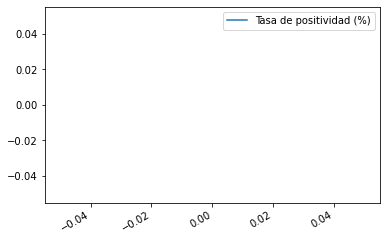

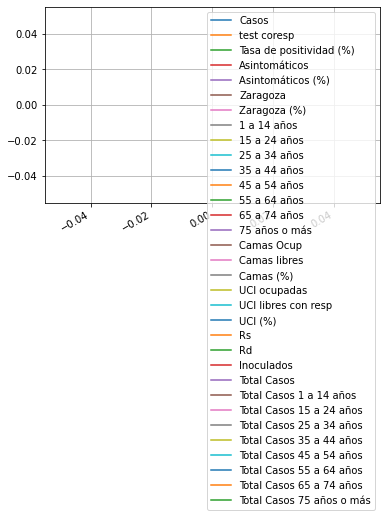

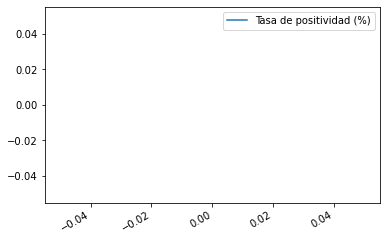

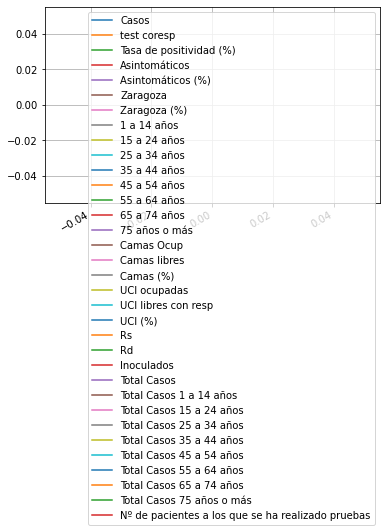

In [54]:
hard2.T.loc['2020-10-1':'2021-3-27',['Tasa de positividad (%)']].plot()
(hard2.T.loc['2020-10-1':'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()
plt.show()
kControl2.T.loc[:'2021-3-27',['Tasa de positividad (%)']].plot()
(kControl2.T.loc[:'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()#goto

In [55]:
diario.loc['2020-10-1':].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)

Fecha
2020-10-01    10.849057
2020-10-02    10.931583
2020-10-03    10.202768
2020-10-04    12.485459
2020-10-05    11.167315
                ...    
2021-09-29     3.878976
2021-09-30     4.463102
2021-10-01     4.629630
2021-10-02     7.507987
2021-10-03     2.256410
Length: 368, dtype: float64

<AxesSubplot:xlabel='Fecha'>

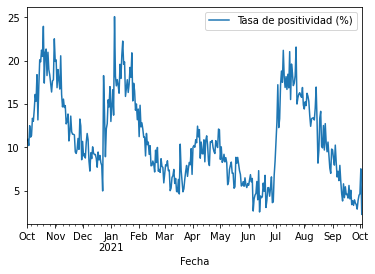

In [56]:
diario.loc['2020-10-1':,['Tasa de positividad (%)']].plot()

In [57]:
((kControl2.T-nuevos)*100./nuevos).dropna(axis=0,how='all').dropna(axis=1,how='all').describe().T

,count,mean,std,min,25%,50%,75%,max
1 a 14 años,3.0,74.452797,33.402001,41.502505,57.534753,73.567000,90.927943,108.288887
15 a 24 años,3.0,-209.202546,84.323199,-271.940374,-257.129737,-242.319099,-177.833632,-113.348164
25 a 34 años,3.0,102.570512,75.005660,30.508680,63.751398,96.994116,138.601428,180.208739
35 a 44 años,3.0,43.073139,37.031990,1.756125,27.972970,54.189815,63.731646,73.273476
45 a 54 años,3.0,116.336972,89.536623,21.452137,74.836155,128.220174,163.779390,199.338606
55 a 64 años,3.0,29.872711,43.368404,1.851154,4.895728,7.940302,43.883490,79.826678
65 a 74 años,3.0,-0.686210,52.963883,-45.473704,-29.915924,-14.358144,21.707536,57.773216
75 años o más,3.0,-8.168683,44.442746,-53.234760,-30.064692,-6.894625,14.364355,35.623335
Asintomáticos,3.0,13.234541,31.027283,-19.863414,-0.978935,17.905544,29.783519,41.661494
Asintomáticos (%),3.0,-6.397394,9.725580,-16.571124,-10.999850,-5.428576,-1.310528,2.807519


In [58]:
nuevos['Nº de pacientes a los que se ha realizado pruebas']

Fecha
2021-10-04    0.0
2021-10-05    0.0
2021-10-06    0.0
2021-10-07    NaN
2021-10-08    NaN
Name: Nº de pacientes a los que se ha realizado pruebas, dtype: float64

<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

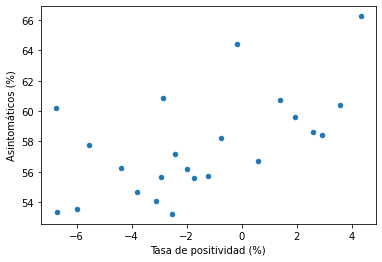

In [59]:
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter')

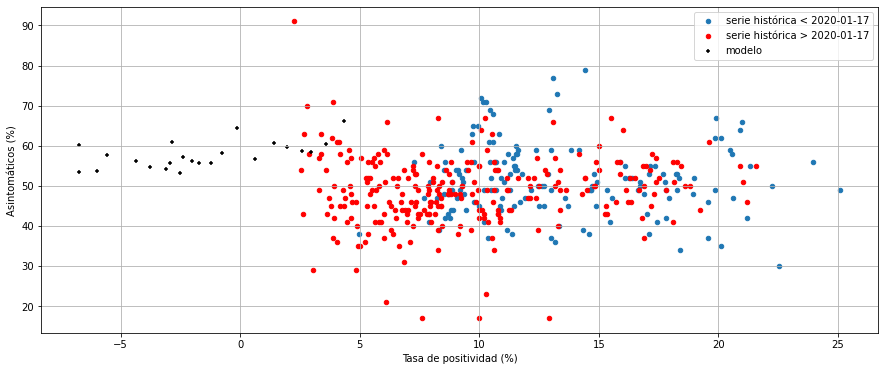

In [60]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-01-17',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-01-17',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [61]:
kControl2.T.columns

Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más',
       'Nº de pacientes a los que se ha realizado pruebas'],
      dtype='object')

In [62]:
total.T

Fecha,2020-08-14,2020-08-15,2020-08-16,2020-08-17,2020-08-18,2020-08-19,2020-08-20,2020-08-21,2020-08-22,2020-08-23,...,2021-09-29,2021-09-30,2021-10-01,2021-10-02,2021-10-03,2021-10-04,2021-10-05,2021-10-06,2021-10-07,2021-10-08
Día de la semana,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,...,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000
Casos,624.000000,482.000000,390.000000,396.000000,467.000000,347.000000,3.570000e+02,272.000000,493.000000,230.000000,...,100.000000,1.010000e+02,60.000000,47.000000,22.000000,67.000000,81.000000,62.000000,NaN,NaN
test coresp,4177.000000,3243.000000,3158.000000,3408.000000,4029.000000,3027.000000,3.191000e+03,2796.000000,4546.000000,1997.000000,...,2578.000000,2.263000e+03,1296.000000,626.000000,975.000000,2402.000000,2462.000000,2343.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,3481.000000,1907.000000,1168.000000,3189.000000,3580.000000,2963.000000,3.219000e+03,2821.000000,1392.000000,617.000000,...,1831.000000,1.687000e+03,1757.000000,919.000000,679.000000,0.000000,0.000000,0.000000,NaN,NaN
Tasa de positividad (%),14.940000,14.860000,12.350000,11.620000,11.590000,11.460000,1.119000e+01,9.730000,10.840000,11.520000,...,3.880000,4.460000e+00,4.630000,7.510000,2.260000,2.790000,3.290000,2.650000,NaN,NaN
Asintomáticos,318.240000,216.900000,230.100000,233.640000,270.860000,190.850000,2.070600e+02,176.800000,310.590000,138.000000,...,71.000000,5.656000e+01,25.200000,20.210000,20.020000,46.900000,46.170000,39.060000,NaN,NaN
Zaragoza,541.000000,428.000000,338.000000,307.000000,394.000000,262.000000,2.800000e+02,217.000000,412.000000,191.000000,...,76.000000,8.700000e+01,48.000000,40.000000,15.000000,45.000000,58.000000,40.000000,NaN,NaN
1 a 14 años,96.000000,67.000000,53.000000,51.000000,49.000000,46.000000,4.600000e+01,41.000000,58.000000,21.000000,...,22.000000,2.100000e+01,9.000000,13.000000,3.000000,7.000000,16.000000,11.000000,NaN,NaN
15 a 24 años,78.000000,51.000000,54.000000,41.000000,50.000000,42.000000,4.200000e+01,29.000000,59.000000,28.000000,...,5.000000,5.000000e+00,4.000000,5.000000,0.000000,6.000000,4.000000,6.000000,NaN,NaN
25 a 34 años,85.000000,64.000000,38.000000,40.000000,72.000000,58.000000,5.800000e+01,44.000000,47.000000,25.000000,...,10.000000,1.100000e+01,10.000000,4.000000,4.000000,4.000000,4.000000,8.000000,NaN,NaN


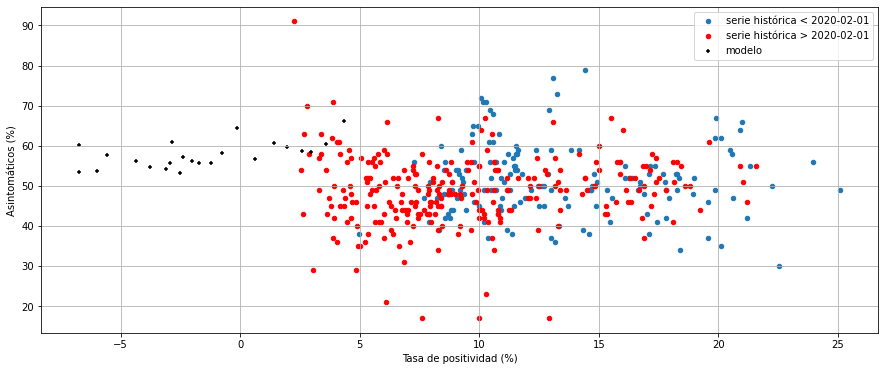

In [63]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-02-01',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-02-01',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [64]:
def histogram_intersection(a, b):
    v = np.minimum(a, b).sum().round(decimals=1)
    return v

total[['Tasa de positividad (%)','Asintomáticos (%)']].corr(min_periods=2)


,Tasa de positividad (%),Asintomáticos (%)
Tasa de positividad (%),1.000000,0.084331
Asintomáticos (%),0.084331,1.000000


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

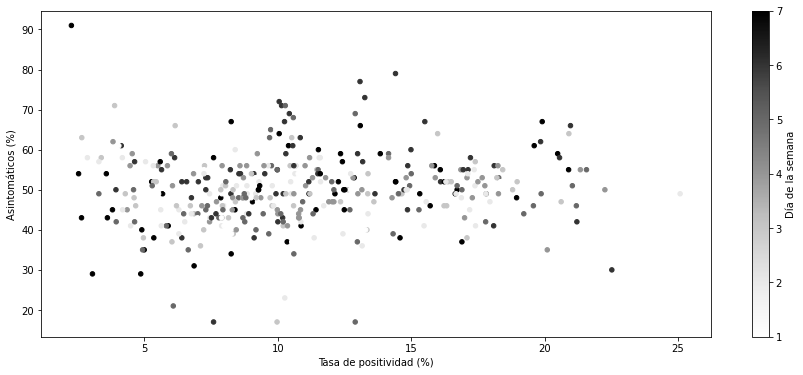

In [65]:
fig, ax = plt.subplots(figsize=(15,6))
total.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

In [66]:
kControl2.loc['Día de la semana',:] = pd.to_datetime(kControl2.columns.values).weekday+1

In [67]:
kControl2

,2021-10-02,2021-10-03,2021-10-04,2021-10-05,2021-10-06,2021-10-07,2021-10-08,2021-10-09,2021-10-10,2021-10-11,...,2021-10-15,2021-10-16,2021-10-17,2021-10-18,2021-10-19,2021-10-20,2021-10-21,2021-10-22,2021-10-23,2021-10-24
Casos,59.823899,40.023065,62.243964,86.877927,82.645752,78.593644,66.817997,44.097863,25.093003,34.113022,...,2.492613,-7.927861,-12.140809,-30.810488,-63.087109,-73.838545,-88.044320,-95.537028,-81.910457,-60.469627
test coresp,1522.711394,1060.507524,1780.281020,2374.369083,2458.362680,2363.149105,2425.793813,1839.974774,1307.692668,2220.826855,...,2578.699660,1853.947588,1256.378408,2040.258449,2619.414554,2678.042619,2541.141494,2553.816077,1883.041090,1298.907150
Tasa de positividad (%),4.327803,3.573480,2.942968,2.589939,1.942726,1.398226,0.602007,-0.149286,-0.756708,-1.224505,...,-2.528075,-2.852365,-2.922691,-3.103671,-3.795945,-4.381214,-5.561011,-5.974018,-6.746311,-6.726503
Asintomáticos,38.943985,24.309011,37.584059,54.436990,55.332980,56.770117,48.609802,39.448686,21.243402,27.830016,...,3.114094,-3.118954,-4.710228,-10.965814,-21.197113,-22.433433,-26.371859,-29.234044,-32.990411,-25.818267
Asintomáticos (%),66.257615,60.409636,58.400213,58.600286,59.579997,60.754595,56.706818,64.429099,58.205460,55.741894,...,53.217176,60.872182,55.642491,54.099009,54.659248,56.278695,57.749443,53.573499,60.209572,53.371536
Zaragoza,48.225351,30.619759,44.765157,69.362342,66.975980,62.986977,53.386111,36.855235,19.915063,25.620579,...,19.906733,10.432753,2.660434,-2.446832,-16.074653,-25.565657,-36.255852,-43.701127,-42.106014,-30.711824
Zaragoza (%),80.050618,75.884947,70.966199,78.151203,80.041945,79.983201,80.284133,83.537721,78.886006,73.390763,...,84.511715,88.485400,84.119142,78.876284,87.140912,89.129050,88.944599,89.071845,92.545126,87.121542
1 a 14 años,12.680364,7.165302,12.149690,22.640401,22.911778,24.009334,23.520321,18.624874,9.420751,14.288672,...,17.275407,12.187998,5.443485,7.156905,10.033478,8.089705,6.460174,4.400186,1.827252,-0.041461
15 a 24 años,3.630272,1.366419,-0.800890,-5.692764,-10.316422,-14.043152,-15.211727,-11.236154,-6.518072,-7.958327,...,-8.446752,-6.874562,-5.609640,-11.756888,-22.930843,-27.182238,-31.144514,-32.392980,-25.001248,-16.934098
25 a 34 años,7.034301,4.828892,7.879765,11.208350,10.440694,9.835876,8.317923,5.106907,2.611442,3.178174,...,-3.000383,-3.255441,-2.655543,-5.122187,-8.615947,-8.697577,-9.216658,-9.529139,-7.584782,-5.458313


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

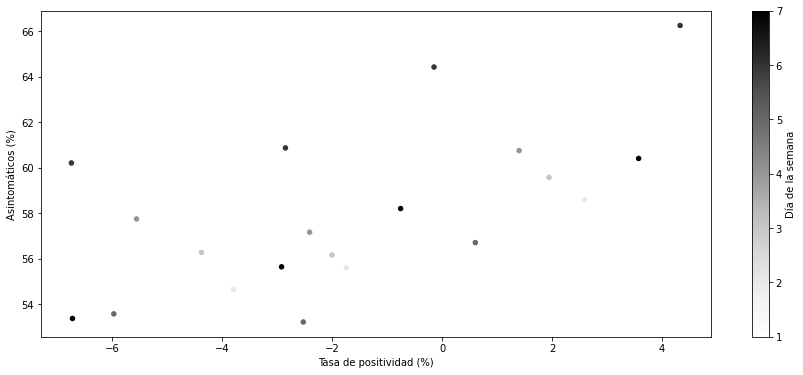

In [68]:
fig, ax = plt.subplots(figsize=(15,6))
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

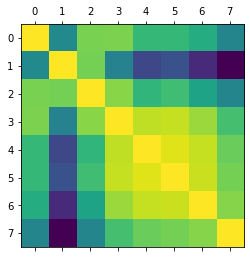

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [69]:
plt.matshow(total[[ '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].corr())
plt.show()
total.columns

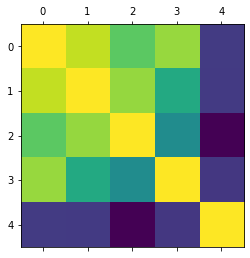

In [70]:
plt.matshow(total[[ 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos (%)']].corr(min_periods=21))
plt.show()

(1.0, 28.0)

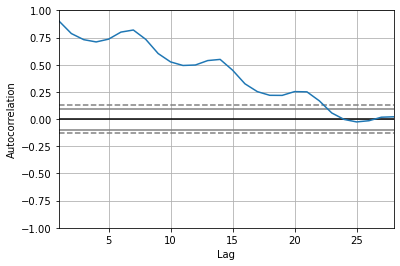

In [71]:
s = diario.Casos
pd.plotting.autocorrelation_plot(s)
plt.xlim(right=28)

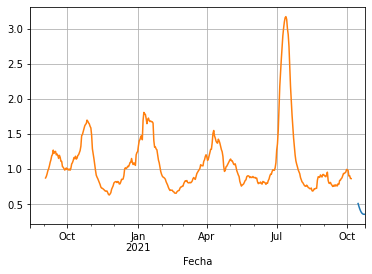

In [72]:
kControl2.T.Rd.rolling(14).mean().plot()
total.Rd.rolling(14).mean().plot()
plt.grid()

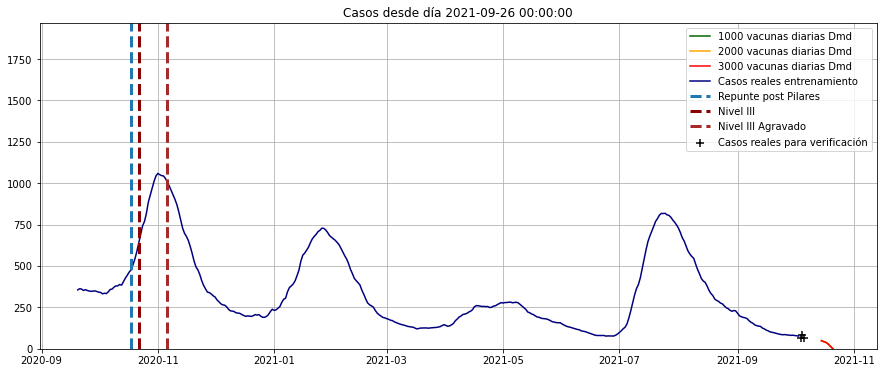

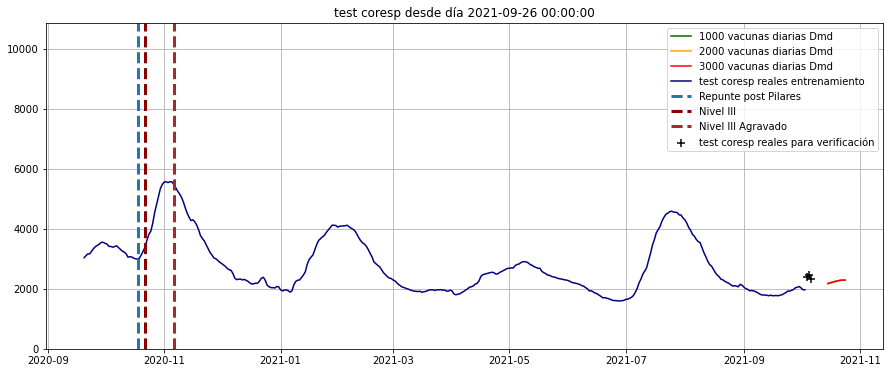

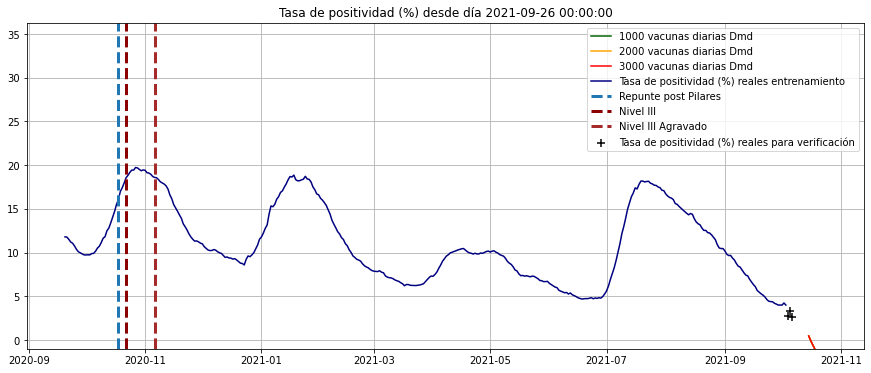

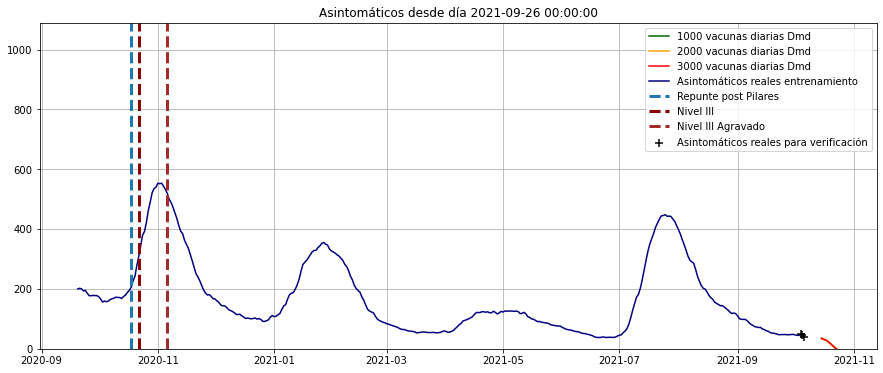

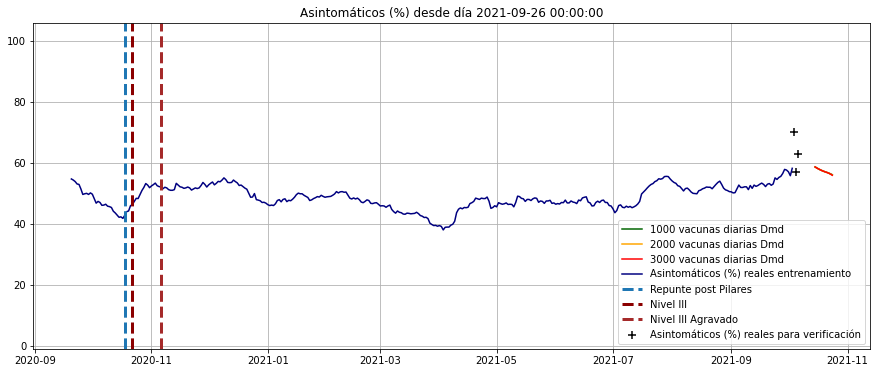

...

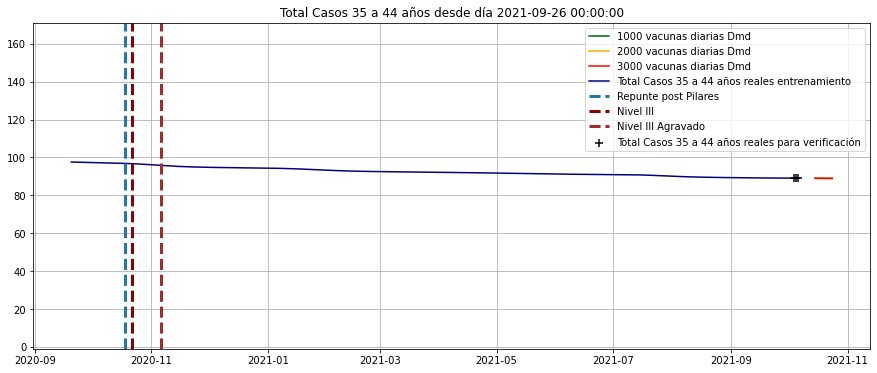

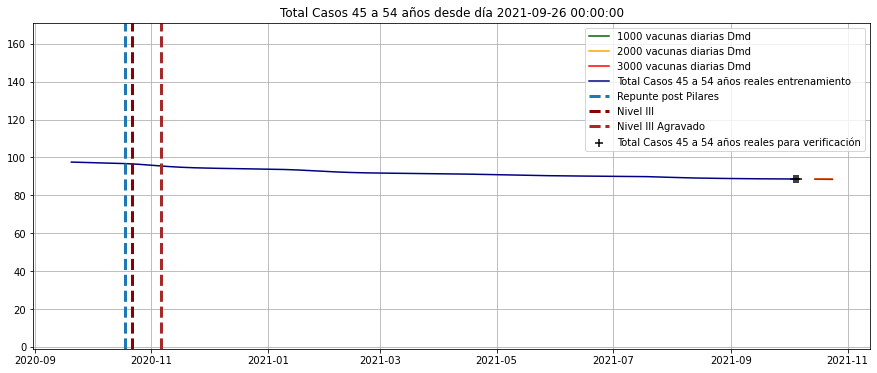

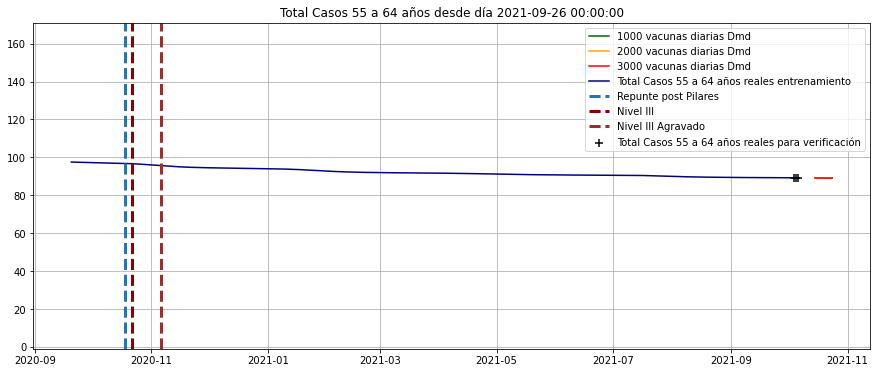

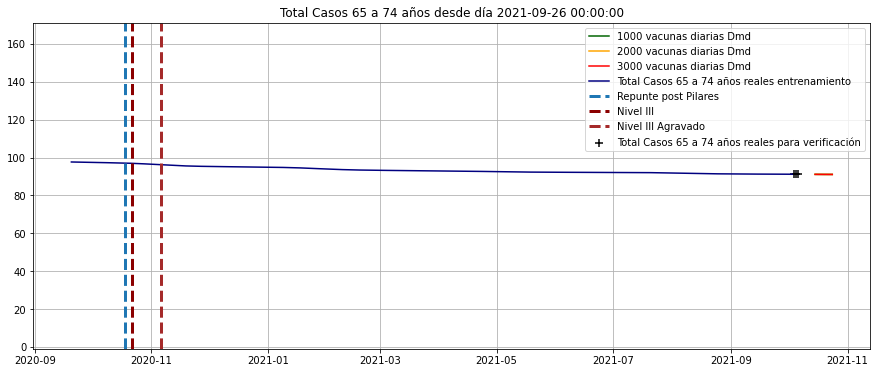

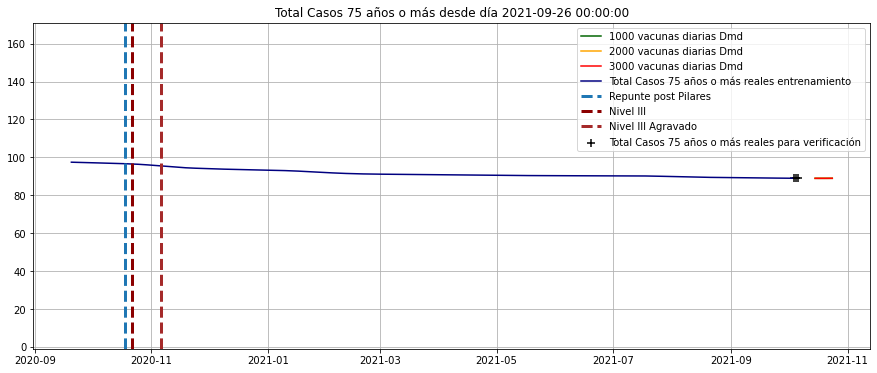

In [73]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]].rolling(14).mean(),axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]].rolling(14).mean(),axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]].rolling(14).mean(),axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]].rolling(14).mean(),axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=-1,top=1.75*X_prima.T.loc['2020-9-7':,i].max())
    plt.grid()
    plt.show()

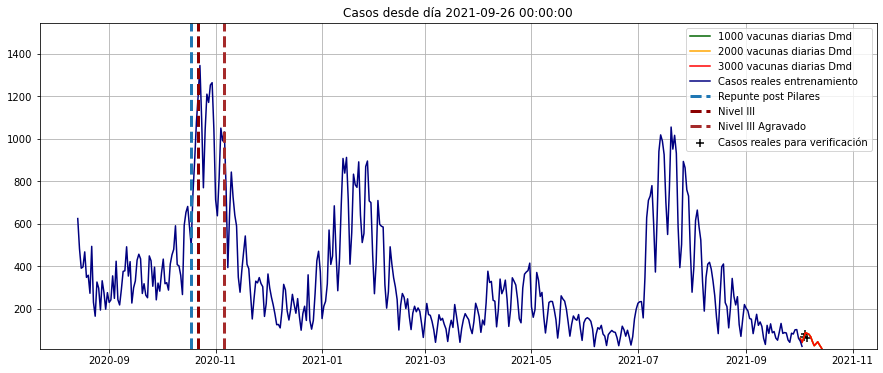

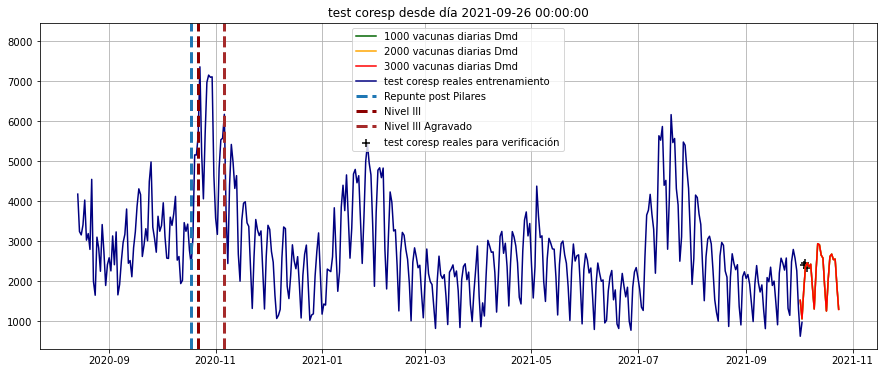

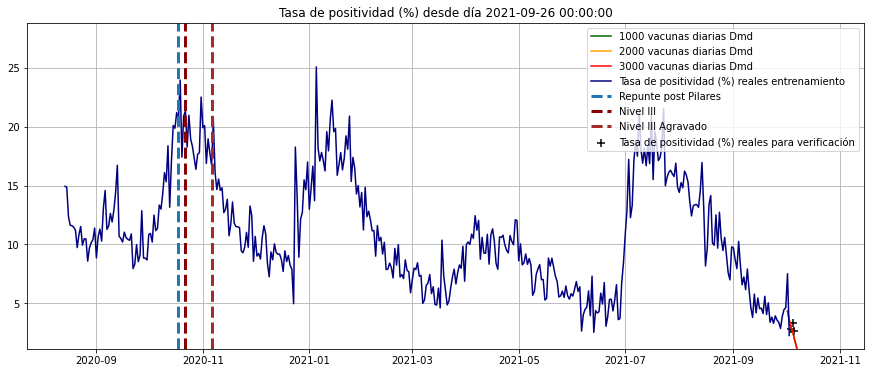

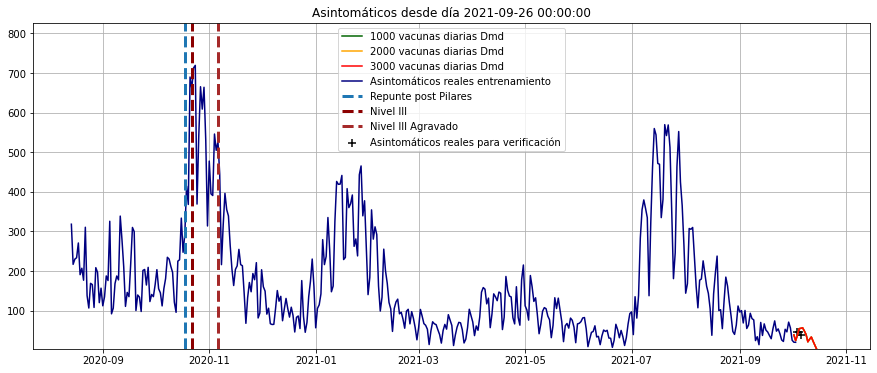

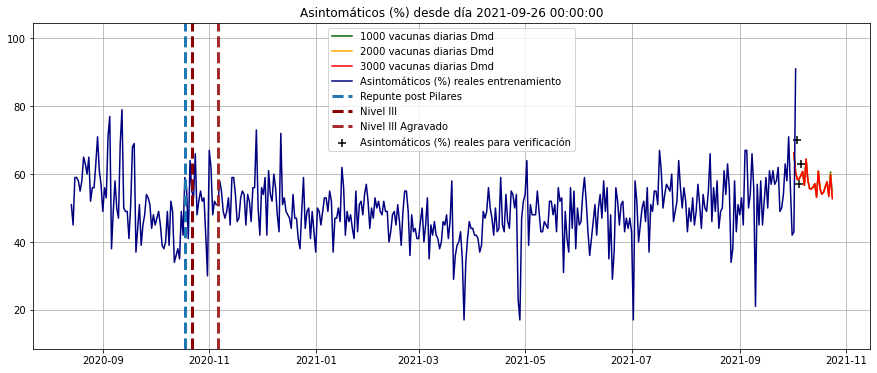

...

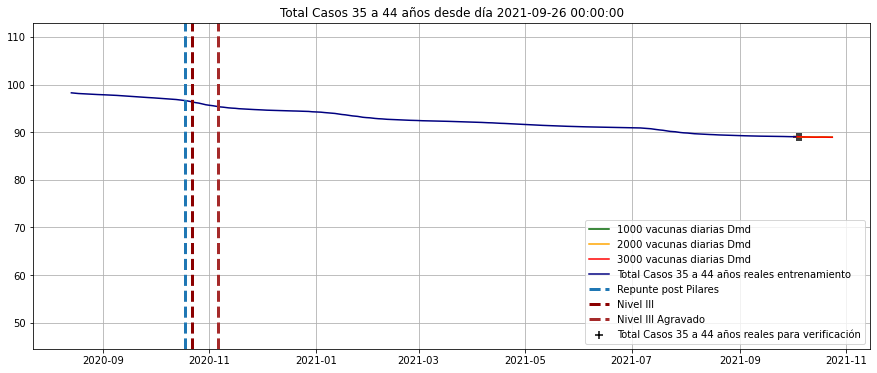

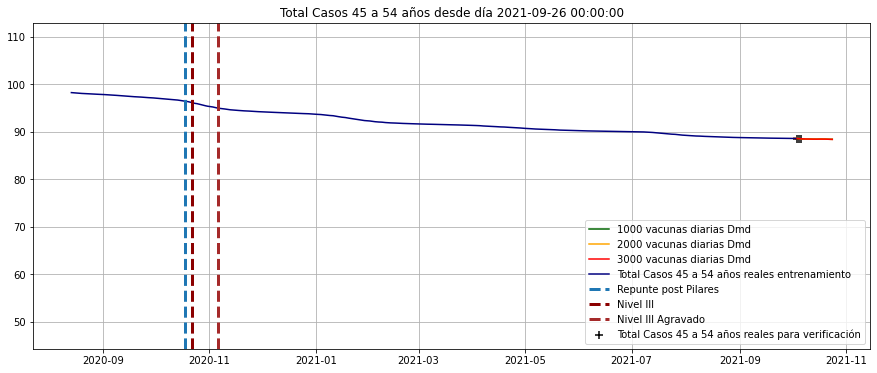

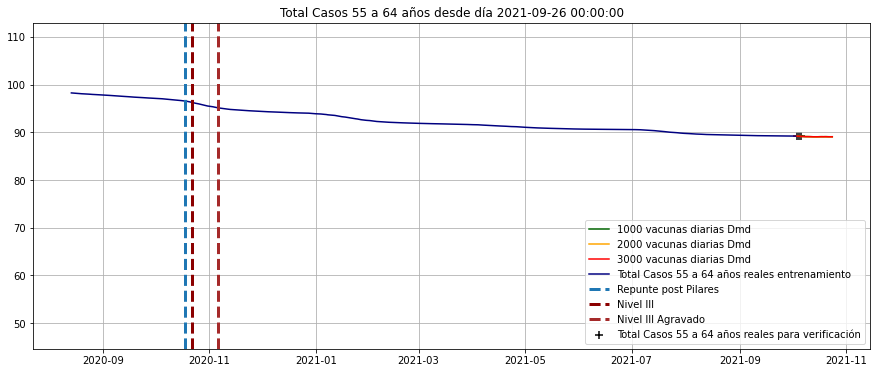

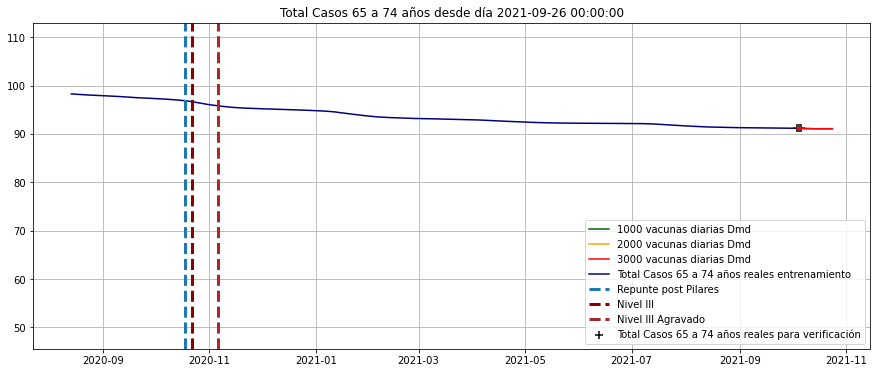

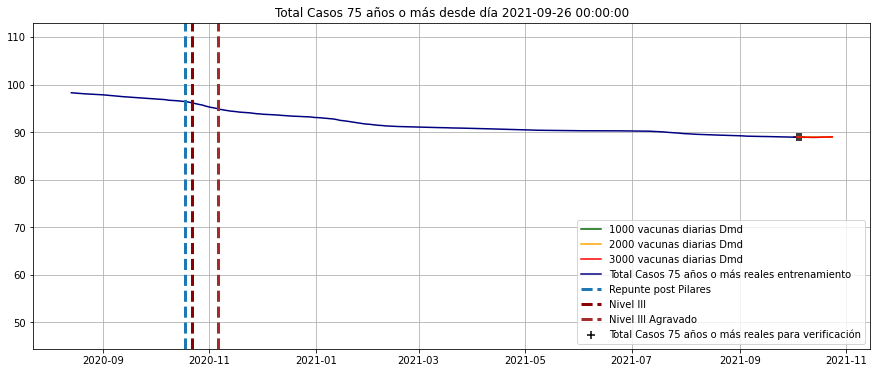

In [74]:
#for i in ['Casos',
#          'test coresp', #'Tasa de positividad (%)',
#          #'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
#          #'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
#          #'15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#          #'55 a 64 años', '65 a 74 años', '75 años o más', 
#          #'Camas Ocup', 'Camas libres', 'Camas (%)', 
#          'UCI ocupadas', 'UCI libres con resp', 'UCI (%)', 
#          #'Rs', 'Rd',
#          #'Inoculados', 'Total Casos'
#         ]:
for i in kControl.T.columns:
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc[:].index,
        diario.loc[:,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc[:].index,
            nuevos.loc[:,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.15*total.loc[:,i].max())
    #plt.xlim(left=pd.Timestamp('2021-2'))
    plt.grid()
    plt.show()
  

In [75]:
kControl.T.columns


Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [76]:
entrenoDesde = '2020-08-16'
entrenoDesde = '2021-03-19'
entrenoHasta = '2021-04-29'
#X = Omega.loc[['Casos', 'test coresp', #'Tasa de positividad (%)',
#       'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)']].iloc[:,:nAjuste]
#X.loc['Bias',:] = 1
variablesAjuste = ['Casos', 'test coresp', #'Tasa de positividad (%)',
       #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                  ]
X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
#X_total.loc['Bias',:] = 1
X = X_total.loc[:,:entrenoHasta]
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


In [77]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Asintomáticos (%)
Fecha,,,
2021-03-19,-0.000683,0.000071,0.000280
2021-03-20,-0.000675,0.000036,0.002118
2021-03-21,-0.000464,0.000030,0.001050
2021-03-22,-0.001272,0.000142,-0.000588
2021-03-23,-0.001136,0.000133,-0.000754
2021-03-24,-0.000855,0.000104,-0.000624
2021-03-25,-0.000452,0.000044,0.000470
2021-03-26,-0.000974,0.000118,-0.000813
2021-03-27,-0.000471,0.000067,-0.000916


In [78]:
#X_prima.loc[['Casos']].iloc[:,-nAjuste:]
X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
X_prima = X_prima_total.loc[X.columns,['Casos']].T
X_prima

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,138.0,...,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0,414.0


In [79]:
A = X_prima.loc[['Casos']].dot( X_pinv)
A

,Casos,test coresp,Asintomáticos (%)
Casos,0.733844,0.014218,0.622168


In [80]:
#A.dot(pd.DataFrame([372,3732,3099,17,1],index=X.index))
display(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision = A.dot(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision.columns = ultimaPrevision.columns + pd.Timedelta(1,unit='D')
ultimaPrevision

Fecha,2021-10-06
Casos,62.0
test coresp,2343.0
Asintomáticos (%),63.0


Fecha,2021-10-07
Casos,118.007114


In [81]:
def verPrevision(fecha=['2021-05-01'],debug=False,A=A):
    dato = total.T.loc[X.index].loc[:,pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D')]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    prevision.index = ['Casos est. linal']
    return prevision.T
verPrevision(['2021-05-03'])

,Casos est. linal
Fecha,
2021-05-03,178.992452


In [82]:
verPrevision(['2021-04-17','2021-04-18','2021-04-19','2021-04-20'])

,Casos est. linal
Fecha,
2021-04-17,314.421717
2021-04-18,249.433524
2021-04-19,132.786631
2021-04-20,204.066230


In [83]:
Casos = total.loc['2020-08-16':,['Casos']].dropna()
Casos = pd.concat([Casos,verPrevision(Casos.index)],axis=1)
Casos

,Casos,Casos est. linal
Fecha,,
2020-08-16,390.0,427.818624
2020-08-17,396.0,367.806801
2020-08-18,467.0,375.764305
2020-08-19,347.0,436.074300
2020-08-20,357.0,331.900304
...,...,...
2021-10-02,47.0,88.587910
2021-10-03,22.0,70.144206
2021-10-04,67.0,86.624152


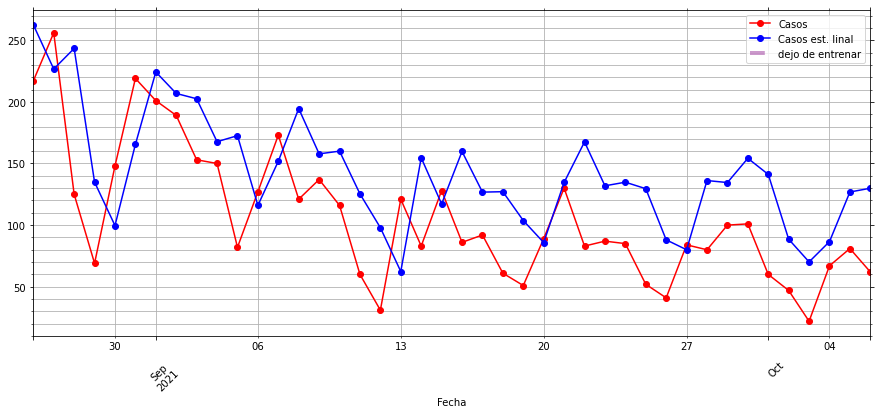

In [84]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-42:].plot(color=['r','b'],style='-o',ax=ax)
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

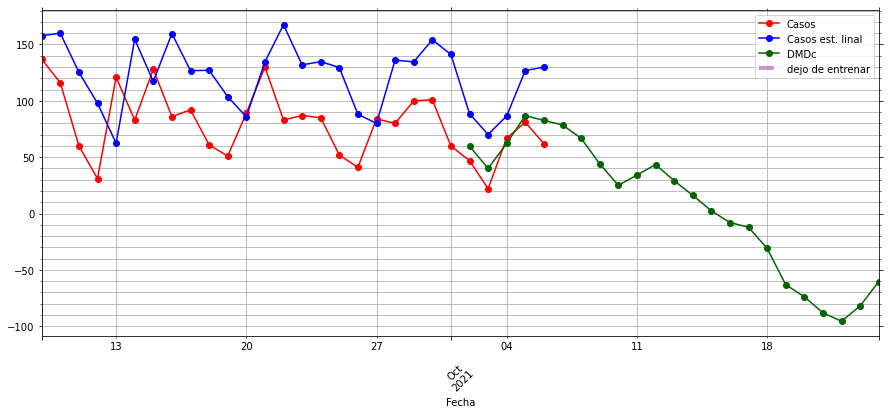

In [85]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['r','b'],style='-o',ax=ax)
kControl2.loc['Casos',
              :#Casos.iloc[-42:].index[-1]
             ].iloc[:35].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

In [86]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(18.025443762784928, 118.22601530497955)

In [87]:
def estimadorCasos(entrenoDesde = '2021-03-19',entrenoHasta = '2021-04-29',
                  variablesAjuste = [
                      'Casos', 'test coresp', #'Tasa de positividad (%)',
                      #'Nº de pacientes a los que se ha realizado pruebas',
                      'Asintomáticos (%)',
                      #'Asintomaticos',
                      #'UCI ocupadas','Camas Ocup',
                      #'Bias',
                  ],
                   plot=True,debug=False
                  ):

    X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
    #X_total.loc['Bias',:] = 1
    
    X = X_total.loc[:,:entrenoHasta].copy()
    X = total[variablesAjuste].loc[entrenoDesde:entrenoHasta].dropna(axis=0).T
    if debug:
        display(X_total) 
    X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
    
    X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
    X_prima = X_prima_total.loc[X.columns,['Casos']].T
    
    A = X_prima.loc[['Casos']].dot( X_pinv)
    
    Casos = total.loc['2020-08-15':,['Casos']].dropna()
    Casos = pd.concat([Casos,verPrevision(Casos.index,A=A)],axis=1)
    
    if plot:
        fig, ax = plt.subplots(figsize=(15,6))


        Casos.iloc[-30:].plot(color=['r','b'],style='-o',ax=ax)
        plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
        plt.legend()
        ax.tick_params(which='both', # Options for both major and minor ticks
                        top='off', # turn off top ticks
                        left='off', # turn off left ticks
                        right='off',  # turn off right ticks
                        bottom='on') # turn off bottom ticks
        ax.minorticks_on()
        ax.xaxis.set_minor_locator(WeekdayLocator(0))
        plt.xticks(rotation=45)

        plt.grid(which='both')
        plt.show()
        
    error =(Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna().copy()
    #if debug:
    #display(error.mean(),error.std())
    
    return error.mean(),error.std()

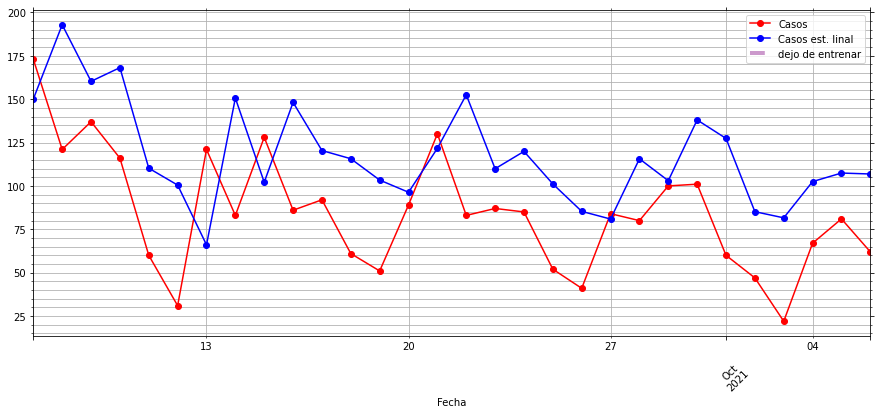

(-5.56809705912638, 113.05504200869952)

In [88]:
kkk =estimadorCasos(entrenoDesde = '2020-09-22',
    entrenoHasta = '2021-04-29')
kkk

In [89]:
for i in total.iloc[-200:-7].index:
    kkk =estimadorCasos(entrenoDesde = i,
    entrenoHasta = '2021-04-29',plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-03-23 00:00:00 20.777734535224884 125.90522895986082
2021-03-24 00:00:00 21.033593821079254 126.31300199629253
2021-03-25 00:00:00 23.31579006200004 130.70233791754455
2021-03-26 00:00:00 24.373462208822577 134.01995250988202
2021-03-27 00:00:00 31.085515954944643 149.07758684236862
2021-03-28 00:00:00 33.02144973820557 153.9716940423486
2021-03-29 00:00:00 32.90430721633296 152.22195547969253
2021-03-30 00:00:00 31.348732621420535 145.87161430264257
2021-03-31 00:00:00 30.527984515905693 146.79637809721027
2021-04-01 00:00:00 47.074141261920495 195.14554753324978
2021-04-02 00:00:00 44.67902190158001 197.52277000658432
2021-04-03 00:00:00 46.13270281285544 197.6546434027336
2021-04-04 00:00:00 44.91891180296037 198.61454504535283
2021-04-05 00:00:00 50.43393172277881 202.77989112449532
2021-04-06 00:00:00 56.6997931035921 205.90762236673658
2021-04-07 00:00:00 62.12591014100698 217.821831330353
2021-04-08 00:00:00 67.23520491276457 226.19235037075637
2021-04-09 00:00:00 61.751939

2021-08-20 00:00:00 335.1507177033493 265.3305503908411
2021-08-21 00:00:00 335.1507177033493 265.3305503908411
2021-08-22 00:00:00 335.1507177033493 265.3305503908411
2021-08-23 00:00:00 335.1507177033493 265.3305503908411
2021-08-24 00:00:00 335.1507177033493 265.3305503908411
2021-08-25 00:00:00 335.1507177033493 265.3305503908411
2021-08-26 00:00:00 335.1507177033493 265.3305503908411
2021-08-27 00:00:00 335.1507177033493 265.3305503908411
2021-08-28 00:00:00 335.1507177033493 265.3305503908411
2021-08-29 00:00:00 335.1507177033493 265.3305503908411
2021-08-30 00:00:00 335.1507177033493 265.3305503908411
2021-08-31 00:00:00 335.1507177033493 265.3305503908411
2021-09-01 00:00:00 335.1507177033493 265.3305503908411
2021-09-02 00:00:00 335.1507177033493 265.3305503908411
2021-09-03 00:00:00 335.1507177033493 265.3305503908411
2021-09-04 00:00:00 335.1507177033493 265.3305503908411
2021-09-05 00:00:00 335.1507177033493 265.3305503908411
2021-09-06 00:00:00 335.1507177033493 265.330550

In [90]:
for i in total.iloc[-76:-3].index:
    kkk =estimadorCasos(entrenoDesde = '2021-03-19',
    entrenoHasta = i,plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-07-25 00:00:00 3.5061608515965315 112.96076814123283
2021-07-26 00:00:00 -0.5722545221532975 113.18399822697053
2021-07-27 00:00:00 -0.58691097923661 113.18646176494259
2021-07-28 00:00:00 0.4533507537797199 113.06839774319707
2021-07-29 00:00:00 0.5056202837394896 113.0626804821975
2021-07-30 00:00:00 2.78999521205992 112.86024524177162
2021-07-31 00:00:00 4.643185549322399 112.82106807940045
2021-08-01 00:00:00 3.6800425910677097 112.80609791574507
2021-08-02 00:00:00 1.9406510733226512 112.86045428239434
2021-08-03 00:00:00 1.3072280973468096 112.90692448977678
2021-08-04 00:00:00 1.7387782319713803 112.87209785011517
2021-08-05 00:00:00 2.1491684403330624 112.85268876851414
2021-08-06 00:00:00 3.460483218291406 112.7861265308649
2021-08-07 00:00:00 4.5433342619365025 112.77129382917099
2021-08-08 00:00:00 3.299550068075066 112.76394959485465
2021-08-09 00:00:00 2.7992028536321807 112.77723501381472
2021-08-10 00:00:00 2.643814309803779 112.7828635869275
2021-08-11 00:00:00 2.8

In [91]:
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


Fecha,2021-04-06,2021-04-07,2021-04-08,2021-04-09,2021-04-10,2021-04-11,2021-04-12,2021-04-13,2021-04-14,2021-04-15,...,2021-09-26,2021-09-27,2021-09-28,2021-09-29,2021-09-30,2021-10-01,2021-10-02,2021-10-03,2021-10-04,2021-10-05
Casos,376.00,323.00,328.00,239.00,235.0,114.00,194.00,339.00,270.00,291.00,...,41.00,84.00,80.00,100.00,101.00,60.00,47.00,22.00,67.00,81.00
test coresp,3022.00,2883.00,2724.00,2734.00,2216.0,1230.00,2099.00,3122.00,3245.00,2699.00,...,1149.00,2484.00,2795.00,2578.00,2263.00,1296.00,626.00,975.00,2402.00,2462.00
Tasa de positividad (%),12.44,11.20,12.04,8.74,10.6,9.27,9.24,10.86,8.32,10.78,...,3.57,3.38,2.86,3.88,4.46,4.63,7.51,2.26,2.79,3.29
Asintomáticos (%),39.00,49.00,47.00,49.00,56.0,50.00,47.00,42.00,50.00,43.00,...,54.00,63.00,58.00,71.00,56.00,42.00,43.00,91.00,70.00,57.00
Casos$^{{-\Delta t}}$,227.00,376.00,323.00,328.00,239.0,235.00,114.00,194.00,339.00,270.00,...,52.00,41.00,84.00,80.00,100.00,101.00,60.00,47.00,22.00,67.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Asintomáticos (%)$^{-26\cdot \Delta t}$,42.00,41.00,38.00,40.00,46.0,45.00,48.00,41.00,46.00,58.00,...,51.00,48.00,53.00,45.00,67.00,67.00,50.00,54.00,66.00,56.00
Casos$^{-27\cdot \Delta t}$,145.00,154.00,126.00,104.00,45.0,108.00,145.00,111.00,219.00,166.00,...,148.00,219.00,201.00,189.00,153.00,150.00,82.00,127.00,173.00,121.00
test coresp$^{-27\cdot \Delta t}$,2158.00,2070.00,2165.00,1626.00,919.0,2226.00,2305.00,2409.00,2114.00,2256.00,...,2116.00,2237.00,2071.00,2169.00,1927.00,1463.00,994.00,1934.00,2392.00,1966.00
Tasa de positividad (%)$^{-27\cdot \Delta t}$,6.72,7.44,5.82,6.40,4.9,4.85,6.29,4.61,10.36,7.36,...,6.99,9.79,9.71,8.71,7.94,10.25,8.25,6.57,7.23,6.15


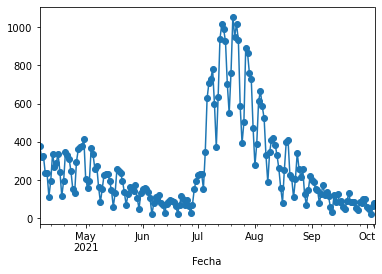

In [106]:
variablesAjuste# = variables
variablesAjuste = ['Casos', 'test coresp', 'Tasa de positividad (%)',
                   #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                   #'Inoculados',
                   #'Total Casos',
                  ]
ventana = 28
entrenoDesde = '2021-04-6'
entrenoHasta = '2021-10-6'
X_total = pd.concat([total.loc[:,variablesAjuste],
                    (total[variablesAjuste].shift(1)
                        #- expData.loc[:,np.concatenate([koopman,estado])]
                    ).add_suffix("$^{{-\Delta t}}$")] + 
                   [ (total[variablesAjuste].shift(i+2) 
                     #-  expData.loc[:,np.concatenate([koopman,estado])]
                     ).add_suffix(
                       "$^{{-{}\cdot \Delta t}}$".format(i+2))
                        for i in range(ventana-2)],axis=1).iloc[ventana-1:].dropna().T#2*ventana]
X_prima_total =total.shift(-1)#.loc[[X.columns],:]
X = X.loc[:,entrenoDesde:entrenoHasta]
##X_prima = X_prima_total.loc[X_total.columns,variablesAjuste].dropna().T
#X_prima = X_prima_total.loc[X_total.columns,['Casos']].dropna().T
X_prima = X_prima_total.loc[entrenoDesde:entrenoHasta,['Casos']].dropna().T
X = X_total.loc[:,X_prima.columns]
X.T.Casos.plot(style='-o')
X

In [107]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-04-06,0.000202,-0.000035,-0.006171,0.000739,0.000265,0.000008,0.001391,-0.000805,-0.000895,0.000076,...,-0.003119,-0.000029,-0.000104,0.000007,0.010874,-0.000622,0.000244,-0.000042,0.001633,0.000868
2021-04-07,-0.000305,0.000006,0.006945,0.001632,0.000712,-0.000078,-0.016590,0.000641,-0.000010,0.000037,...,-0.001331,-0.000418,-0.000099,0.000013,-0.000034,-0.000171,0.000116,-0.000022,0.006115,-0.000081
2021-04-08,-0.000374,0.000045,0.008332,0.000512,0.000031,-0.000026,-0.001204,0.001560,0.000494,-0.000057,...,-0.012436,-0.000153,-0.000358,0.000025,0.000521,-0.000262,0.000006,0.000002,0.001324,0.000285
2021-04-09,-0.000942,0.000096,-0.001709,-0.001003,-0.000107,0.000040,0.013836,-0.000813,0.000060,-0.000056,...,0.018712,0.000185,0.000664,-0.000084,-0.012407,0.000766,-0.000339,0.000007,-0.001974,0.001115
2021-04-10,0.000068,0.000016,-0.007490,0.000815,-0.001069,0.000110,0.005710,-0.001493,-0.000027,0.000027,...,0.003380,-0.000025,-0.000382,0.000070,0.019570,-0.000056,0.000308,-0.000068,-0.009540,0.001221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-01,0.000533,-0.000104,-0.016394,-0.000109,-0.000667,0.000095,0.017486,-0.001917,-0.000157,0.000026,...,-0.013281,-0.000335,-0.000341,0.000065,0.022614,0.001013,-0.000130,0.000020,0.002218,0.002111
2021-10-02,-0.000717,0.000037,0.015257,-0.000872,0.001077,-0.000157,-0.024363,0.000237,-0.000534,0.000081,...,0.019746,-0.001316,0.000557,-0.000068,-0.012958,-0.000524,-0.000182,0.000029,0.017067,0.001562
2021-10-03,0.000015,-0.000003,-0.005098,0.002136,-0.000390,0.000011,0.011760,-0.001783,0.000625,-0.000123,...,-0.023184,0.000712,-0.000812,0.000077,0.021486,-0.000749,0.000577,-0.000070,-0.010646,0.000146


In [108]:
A = X_prima.dot( X_pinv)
A
#X_prima

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Casos,0.765408,-0.022188,0.597719,-1.207786,-0.213096,-0.001572,4.57817,-0.091266,0.340727,0.011187,...,1.160263,0.597714,0.33393,-0.061214,-14.051499,1.307975,-0.46064,0.064343,15.518419,-0.702327


In [109]:
def verPrevision(fecha=['2021-05-07'],debug=False,A=A,X=X):
    dato = X_total.loc[:,X_total.columns.intersection(pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D'))]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    #prevision.index = ['Casos est. lineal']
    prevision.index = ["{} est. lineal".format(i) for i in prevision.index]
    return prevision.T
verPrevision(A=A,debug=True)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-06,257.0,3093.0,8.31,48.0,334.0,3634.0,9.19,48.0,370.0,4377.0,...,9.27,50.0,235.0,2216.0,10.6,56.0,239.0,2734.0,8.74,49.0


,Casos est. lineal
Fecha,
2021-05-07,217.958435


In [110]:
Casos =  total.loc[entrenoDesde:,'Casos'].dropna()
#Casos =  total.loc['2021-01':,'Casos'].dropna()


Casos.iloc[5:]

Fecha
2021-04-11    114.0
2021-04-12    194.0
2021-04-13    339.0
2021-04-14    270.0
2021-04-15    291.0
              ...  
2021-10-02     47.0
2021-10-03     22.0
2021-10-04     67.0
2021-10-05     81.0
2021-10-06     62.0
Name: Casos, Length: 179, dtype: float64

In [111]:
verPrevision(Casos.iloc[5:].index,A=A,X=X)

,Casos est. lineal
Fecha,
2021-04-11,139.803923
2021-04-12,198.260501
2021-04-13,357.884587
2021-04-14,288.499018
2021-04-15,318.077396
...,...
2021-10-02,103.930988
2021-10-03,41.450438
2021-10-04,72.395372


In [112]:
#Casos = total.loc['2020-09-01':,['Casos']].dropna()
Casos = pd.concat([Casos.iloc[5:],verPrevision(Casos.iloc[5:].index,A=A,X=X)],axis=1)
ultimaPrevision = verPrevision(fecha=['2021-10-7'])
Casos.loc[ultimaPrevision.index[0],'Casos est. lineal'] = ultimaPrevision.iat[0,0]
Casos


,Casos,Casos est. lineal
Fecha,,
2021-04-11,114.0,139.803923
2021-04-12,194.0,198.260501
2021-04-13,339.0,357.884587
2021-04-14,270.0,288.499018
2021-04-15,291.0,318.077396
...,...,...
2021-10-03,22.0,41.450438
2021-10-04,67.0,72.395372
2021-10-05,81.0,104.587994


In [113]:
Casos.index[0]#+ pd.Timedelta(7,unit='D')

Timestamp('2021-04-11 00:00:00')

,Casos,Casos est. lineal,Casos DMDc
2021-10-02,47.0,103.930988,59.823899
2021-10-03,22.0,41.450438,40.023065
2021-10-04,67.0,72.395372,62.243964
2021-10-05,81.0,104.587994,86.877927
2021-10-06,62.0,73.102833,82.645752
2021-10-07,NaN,90.220657,78.593644
2021-10-08,NaN,NaN,66.817997
2021-10-09,NaN,NaN,44.097863
2021-10-10,NaN,NaN,25.093003
2021-10-11,NaN,NaN,34.113022


(0.6417183388175002, 30.07392394316054)

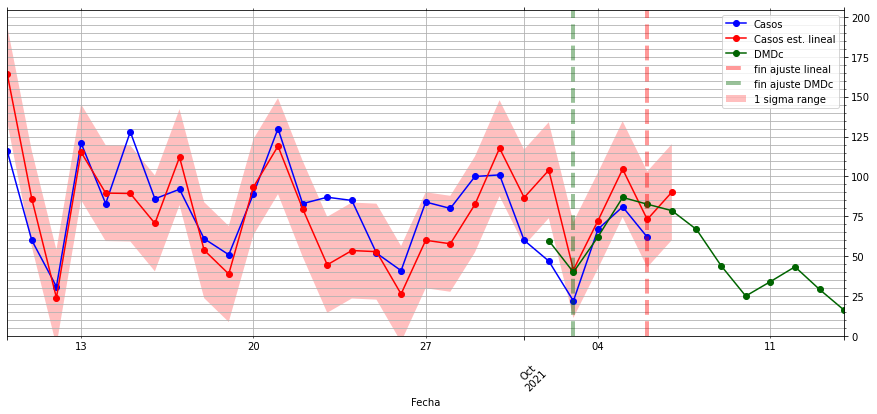

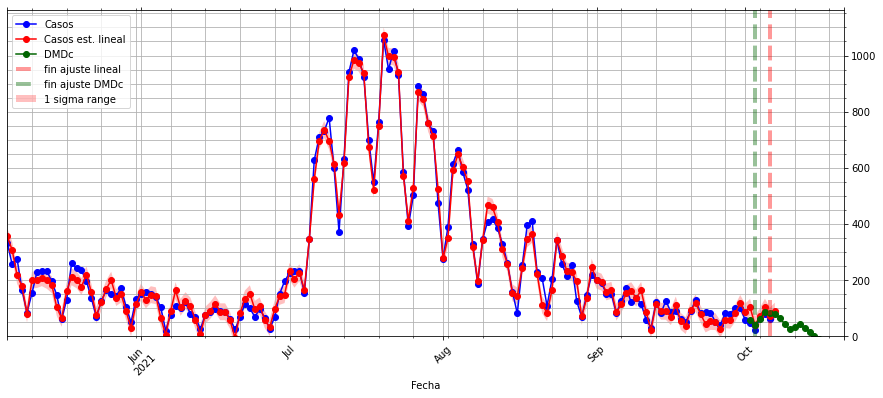

In [114]:
errorSTD = ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-35:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-28:].index, 
                Casos.iloc[-28:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-28:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(14,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-156:].index, 
                Casos.iloc[-156:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-156:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')


plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')

Ajustes = pd.concat([Casos,kControl2.T.loc[Casos.index[-7]:,['Casos']].iloc[:11,:].rename(columns={'Casos':'Casos DMDc'})],axis=1).tail(11)
display(Ajustes)
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

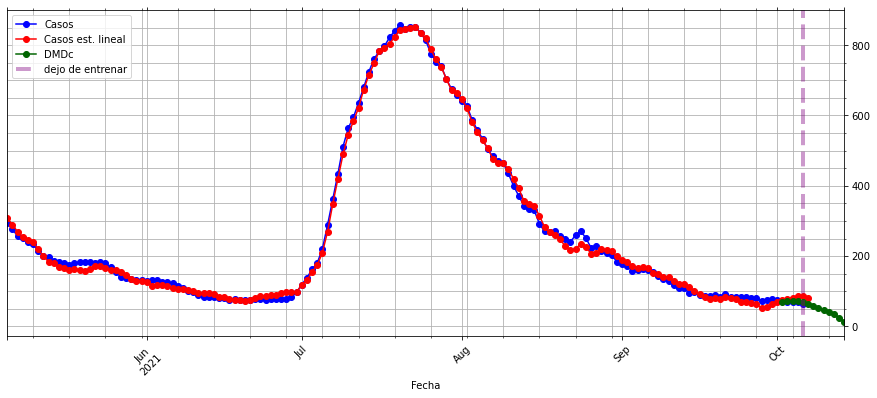

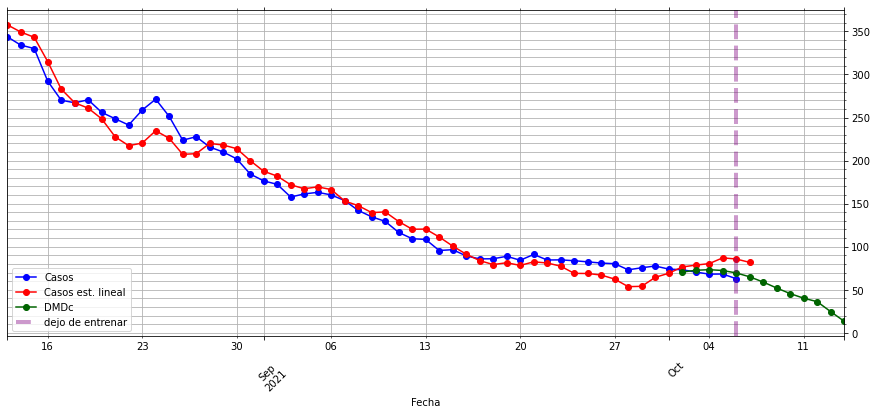

In [115]:
#goto
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
             ].iloc[-21:].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-56:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-50:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')

In [116]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(0.6417183388175002, 30.07392394316054)

In [117]:
colores = plt.cm.tab20b.colors
colores = dict(zip(U_hat_r.index,plt.cm.tab20b.colors + plt.cm.Pastel1.colors[:6]))

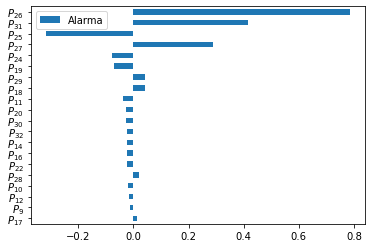

In [118]:
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

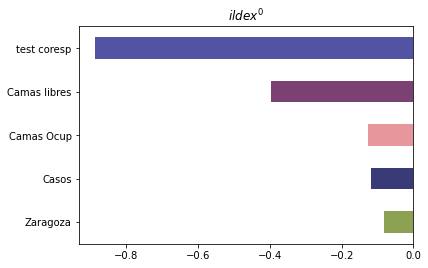

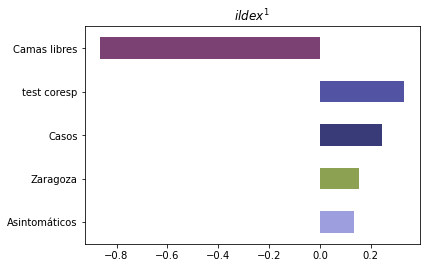

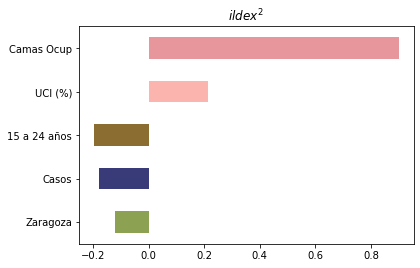

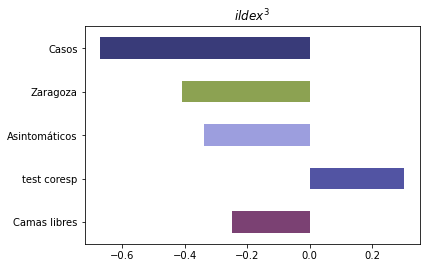

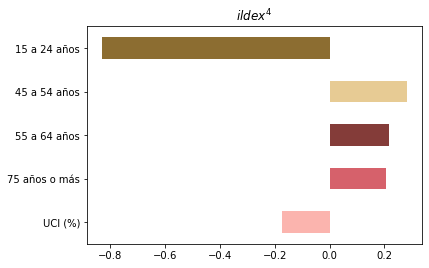

...

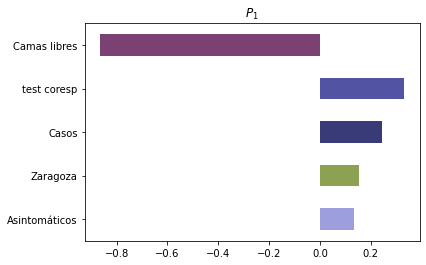

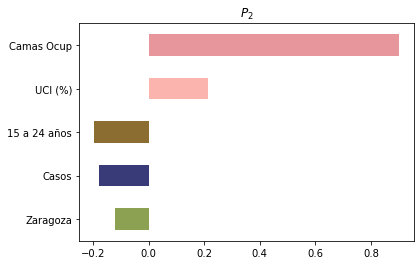

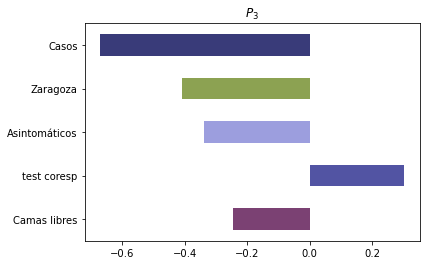

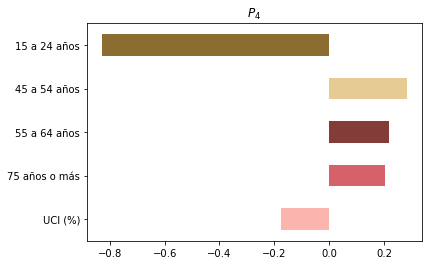

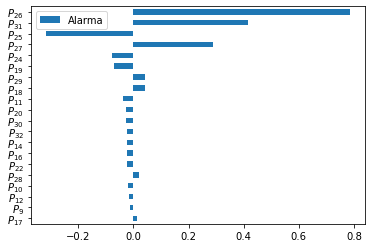

KeyError: 'Total Casos 75 años o más'

In [119]:
for i in U_hat_r.columns[:5]: 
    componentes = U_hat_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
for i in U_tilde_1_r.columns[:5]: 
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

for i in U_tilde_2_r.T.sort_values(by='Alarma',key=abs).loc[::-1].head(10).index:
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()

In [ ]:
diario.Alarma.sort_index(ascending=False).to_excel("kk.xlsx")

In [ ]:
len(fsys_A_tilde.B),len(fsys_A_tilde.B[0])

In [ ]:
ktf= ct.ss2tf(fsys_A_tilde)

In [ ]:
diario.Casos.dtype?


In [ ]:
df = pd.DataFrame(index=[1,2,4])
df

In [ ]:

df.loc[:,'error'] = [[1,2],[2,3],[3,4]]

In [ ]:
df.loc[3,'error'] = range(3)
df

In [ ]:
df.dtypes